# Pharma: individual participant analyses

All analyses use **10 presented samples, complete presentation, and a valid response**, matching `IB_analysis.ipynb`. Each participant has an information-plane plot and two six-panel psychometric plots (rows: hazard; columns: drug).

Distribution **1 is the positive-mean source (+28)**; distribution 2 has mean −28, with SD 28. The posterior uses the rounded/clipped Gaussian likelihood from `IB_analysis.ipynb`, the condition's hazard rate, and a uniform prior. The full posterior uses all 10 samples; 1b restarts from the uniform prior and uses only the last sample. Recorded ±89.99 stimulus endpoints are mapped to the clipped ±90 likelihood bins. Choices retain the CSV coding: `response == 1`.

Information estimates and their saved 95% bootstrap intervals come from `ibdf.csv`; their trial counts are checked against the selected trials. Only the **low-hazard full and 1b Monte Carlo IB bounds** are computed. These numerical reference curves use the algorithm in `IB_analysis.ipynb`, with a fixed simulation seed for reproducibility; they are not participant-specific fits.

Psychometrics use the same joint 10 × 10 grid of equally spaced probability bins on [0, 1] for every condition and participant. Each occupied joint bin contributes a point; empty bins remain missing. Color indicates the other posterior's bin center and marker area indicates trial count. Thus both views show the same empirical choice probabilities, with different horizontal coordinates. Sparse bins are displayed, so extreme probabilities in small bins should be read with their counts in mind.

Run the shared setup once, then any participant section. The bound calculation is the slowest step. No raw MATLAB files or execution of another notebook is required.

## Shared setup

In [1]:
from pathlib import Path
import multiprocessing as mp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import norm
from IPython.display import display

ROOT = next((p for p in [Path.cwd(), *Path.cwd().parents]
             if (p / 'pharma' / 'ibdf.csv').is_file()), None)
if ROOT is None:
    raise FileNotFoundError('Run from the repository root or a subdirectory.')
DATA_DIR = ROOT / 'pharma'
HAZARDS = [0.1, 0.9]
DRUGS = ['placebo', 'atomoxetine', 'donepizil']  # CSV spelling
CONDITIONS = [(h, d) for h in HAZARDS for d in DRUGS]
COLORS = dict(zip(CONDITIONS, ['#2166ac', '#008b8b', '#6a51a3',
                             '#d73027', '#ef8a22', '#a63603']))
MARKERS = dict(zip(DRUGS, ['o', 's', '^']))
BIN_EDGES = np.linspace(0, 1, 11)
mean_neg, mean_pos, std = -28., 28., 28.
P0 = np.array([[0.5], [0.5]])

In [2]:
metadata = pd.read_csv(DATA_DIR / 'metadata.csv')
trials = pd.read_csv(DATA_DIR / 'trials.csv')
stimuli = pd.read_csv(DATA_DIR / 'stimuli.csv')
ibdf = pd.read_csv(DATA_DIR / 'ibdf.csv')
keys = ['participant', 'session', 'run']
assert not metadata.duplicated(keys).any()
assert trials.trial_id.is_unique
# Metadata is the authoritative run-to-condition mapping; verify CSV agreement.
trials = trials.merge(metadata[keys + ['H', 'drug']], on=keys,
                      how='left', validate='many_to_one', suffixes=('', '_metadata'))
assert trials.H_metadata.notna().all()
assert np.allclose(trials.H, trials.H_metadata)
assert trials.drug.eq(trials.drug_metadata).all()
selected = trials.loc[trials.n_samples_presented.eq(10)
                      & trials.valid_response & trials.presentation_complete].copy()
assert selected.response.isin([1, 2]).all()
shown = stimuli.loc[stimuli.presented & stimuli.trial_id.isin(selected.trial_id)]
assert not shown.duplicated(['trial_id', 'sample_in_trial']).any()
sample_matrix = shown.pivot(index='trial_id', columns='sample_in_trial',
                            values='stimulus_value').reindex(selected.trial_id)
assert list(sample_matrix.columns) == list(range(1, 11))
X = sample_matrix.to_numpy()
# Recorded boundary values ±89.99 denote the clipped ±90 likelihood bins.
X[np.isclose(X, -89.99)] = -90
X[np.isclose(X, 89.99)] = 90
assert np.isfinite(X).all() and np.equal(X, np.rint(X)).all()
assert ((X >= -90) & (X <= 90)).all()
X = X.astype(int)
# Check source coding against the observed generating distributions.
source_means = shown.groupby('generating_distribution').stimulus_value.mean()
assert source_means.loc[1] > 0 > source_means.loc[2]
condition_keys = ['participant', 'H', 'drug']
counts = selected.groupby(condition_keys).size().rename('selected_trials')
count_check = ibdf.rename(columns={'subject_ID': 'participant'}).merge(
    counts.reset_index(), on=condition_keys, how='outer', validate='one_to_one')
assert count_check[['Ntrials', 'selected_trials']].notna().all().all()
assert count_check.Ntrials.eq(count_check.selected_trials).all()
participants = sorted(metadata.participant.unique())
assert set(participants) == set(ibdf.subject_ID)
assert len(ibdf) == len(participants) * 6
assert set(zip(ibdf.H, ibdf.drug)) == set(CONDITIONS)
print(f'{len(participants)} participants; {len(selected):,} eligible trials; '
      'all 180 condition counts match ibdf.csv.')

30 participants; 78,630 eligible trials; all 180 condition counts match ibdf.csv.


In [3]:
from scipy.stats import norm

def P_source_g_samples(samples_arr,mean_neg,mean_pos,std,h,P0,window_size=None):
    P_sample_g_neg = np.diff(np.concatenate([np.array([0]),norm(loc=mean_neg,scale=std).cdf(np.arange(-89.5,90.5,1)),np.array([1])]))
    P_sample_g_pos = np.diff(np.concatenate([np.array([0]),norm(loc=mean_pos,scale=std).cdf(np.arange(-89.5,90.5,1)),np.array([1])]))
    # P_sample_g_neg = norm(loc=mean_neg, scale=std)
    # P_sample_g_pos = norm(loc=mean_pos, scale=std)
    Lneg = P_sample_g_neg[samples_arr + 90]
    Lpos = P_sample_g_pos[samples_arr + 90]
    L = np.concatenate((Lneg[:,np.newaxis,:],Lpos[:,np.newaxis,:]),axis=1)
    H = np.array([
        [1-h, h],
        [h, 1-h]
    ])
    P = P0.copy()
    if window_size is not None:
        L = L[:,:,-window_size:]
    for ii in range(L.shape[2]):
        P = L[:,:,ii][:,:,np.newaxis] * (H @ P)
    P = P / P.sum(axis=1, keepdims=True)
    return P[:, :, 0]

In [4]:
selected['posterior_full'] = np.nan
selected['posterior_1b'] = np.nan
for h in HAZARDS:
    mask = selected.H.eq(h).to_numpy()
    for column, window in [('posterior_full', None), ('posterior_1b', 1)]:
        # Column 1 is positive-mean source, i.e. CSV distribution 1.
        selected.loc[mask, column] = P_source_g_samples(
            X[mask], mean_neg, mean_pos, std, h, P0, window_size=window)[:, 1]
assert np.isfinite(selected[['posterior_full', 'posterior_1b']]).all().all()

### Low-hazard IB reference curves

The following functions reproduce the empirical Monte Carlo IB updates from `IB_analysis.ipynb` and the information formulas in `utilities.py`. Simulation uses 10,000 mirrored trials of length 10, H = 0.1, 200 beta values up to 10, and three initializations. Bounds are computed once and reused for all subjects. To bound runtime, convergence uses an objective-change tolerance of 1e-12 (instead of 1e-15) and a 5,000-iteration cap (instead of 100,000). Convergence is retained for each selected solution and any capped solutions are reported. Multiprocessing uses four workers; set `BOUND_WORKERS = 1` for serial execution.

In [5]:
def compute_I_XR_emp(q):
    return np.sum(q * np.log2(q / q.mean(axis=0, keepdims=True))) / len(q)

def compute_I_RY_emp(q, y):
    joint = np.eye(2)[y.astype(int)].T @ q / len(q)
    return np.sum(joint * np.log2(joint / (joint.sum(axis=1, keepdims=True)
                                             * joint.sum(axis=0, keepdims=True))))

In [6]:
def generate_trials(n_trials, n_draws, source_means, scale, H, mirror_trials=False, balanced_starts=False, seed=None):
    """Generate trials from a two-state switching Gaussian process.

    Parameters
    ----------
    n_trials : int
        Number of independent trials to generate.
    balanced_starts : bool, default=False
        If True, exactly half of the trials start in each source
        distribution. This requires an even ``n_trials``.
    seed : int or None, default=None
        Seed for NumPy's random-number generator. Use an integer for
        reproducible simulations.

    Returns
    -------
    X : ndarray of int, shape (n_trials, n_draws)
        Clipped and rounded observations for each trial.
    Y : ndarray of int, shape (n_trials,)
        Identity of the source for the final draw: 0 denotes the Gaussian
        with mean -28 and 1 denotes the Gaussian with mean 28.
    """
    if isinstance(n_trials, (bool, np.bool_)) or not isinstance(n_trials, (int, np.integer)):
        raise TypeError("n_trials must be an integer")
    if n_trials < 0:
        raise ValueError("n_trials must be non-negative")
    if (balanced_starts or mirror_trials) and n_trials % 2:
        raise ValueError("balanced_starts=True or mirror_trials=True requires an even n_trials")

    rng = np.random.default_rng(seed)
    n_draws = n_draws
    source_means = np.array(source_means)

    if mirror_trials:
        n_trials_ = n_trials // 2
    else:
        n_trials_ = n_trials

    if balanced_starts:
        starts = np.repeat([0, 1], n_trials_ // 2)
        rng.shuffle(starts)
    else:
        starts = rng.integers(0, 2, size=n_trials_)

    # switches[:, j] indicates whether the source changes between draws
    # j and j + 1. Cumulative parity therefore gives the source at each draw.
    switches = rng.random((n_trials_, n_draws - 1)) < H
    source_paths = np.column_stack(
        [starts, starts[:, None] ^ np.logical_xor.accumulate(switches, axis=1)]
    ).astype(int)

    raw_draws = rng.normal(loc=source_means[source_paths], scale=scale)
    X = np.rint(np.clip(raw_draws, -90, 90)).astype(int)
    Y = source_paths[:, -1].copy()
    if mirror_trials:
        X = np.concatenate([X, -X], axis=0)
        Y = np.concatenate([Y, 1-Y], axis=0)
    return X, Y

def IB_fn_emp(beta,p_RgX_emp,Yemp):
    Ixr = compute_I_XR_emp(p_RgX_emp)
    Iry = compute_I_RY_emp(p_RgX_emp,Yemp)
    return Ixr - beta*Iry

def mc_IB(beta,Ysample,p_YgX_sample,iterlimit=100000,init='random',N_inits=3,betastar=None,seed=209,return_dict=True):

    rng = np.random.default_rng(seed)

    N_y = p_YgX_sample.shape[1]
    N_x = p_YgX_sample.shape[0]

    Yoh = np.eye(N_y)[Ysample.astype(int)]

    IB_fxn_vals = []
    convergence = []
    p_RgXs = []
    p_Rs = []
    p_YgRs = []

    for ii in range(N_inits):
        p_R = (np.ones(N_y) / N_y).reshape(1,-1)
        if init == 'random':
            p_RX = np.exp(rng.random((N_x,N_y)))
            p_RgX = p_RX / np.sum(p_RX,axis=1,keepdims=True)
        elif init == 'softmax':
            if betastar is None:
                betastar = beta
            p_RgX = np.exp(betastar*p_YgX_sample) / np.sum(np.exp(betastar*p_YgX_sample),axis=1,keepdims=True)
        p_RX = p_RgX * (1/N_x)
        p_XgR = p_RX / p_R
        p_YgR = Yoh.T @ p_XgR
        IB_fxn = IB_fn_emp(beta,p_RgX,Ysample)
        delta = 1
        iters = 0
        while (delta > 1e-12) or (iters < 100):
            # store last copy
            IB_fxn_last = IB_fxn

            # update p(r|x)
            p_RX = p_R * np.exp(beta*(p_YgX_sample @ np.log(p_YgR))) # we can simplify the original update rule (below) to this
            # p_RX = p_R * np.exp(-beta*np.sum(p_YgX[:,:,np.newaxis] * (np.log(p_YgX[:,:,np.newaxis]) - np.log(p_YgR[np.newaxis,:,:])),axis=1))
            p_RgX = p_RX / np.sum(p_RX,axis=1,keepdims=True)


            # update p(r)
            p_R = p_RgX.sum(axis=0,keepdims=True) / N_x

            #update p(y|r)
            p_RX = p_RgX * (1/N_x)
            p_XgR = p_RX / p_R
            p_YgR = Yoh.T @ p_XgR

            IB_fxn = IB_fn_emp(beta,p_RgX,Ysample)

            delta = np.abs(IB_fxn - IB_fxn_last)
            iters += 1
            if iters == iterlimit:
                break
        convergence.append(delta <= 1e-12)
        IB_fxn_vals.append(IB_fxn.copy())
        p_RgXs.append(p_RgX.copy())
        p_Rs.append(p_R.copy())
        p_YgRs.append(p_YgR.copy())

    min_ind = np.argmin(np.array(IB_fxn_vals))
    p_RgX = p_RgXs[min_ind]
    p_R = p_Rs[min_ind]
    p_YgR = p_YgRs[min_ind]

    H_R = -np.sum(p_R * np.log2(p_R))
    I_XR = compute_I_XR_emp(p_RgX)
    I_RY = compute_I_RY_emp(p_RgX,Ysample)

    if return_dict:
        out = {
            'I_XR': I_XR,
            'I_RY': I_RY,
            'beta': beta,
            'H_R': H_R,
            'p_YgR': p_YgR,
            'p_R': p_R,
            'betastar': betastar, 'converged': convergence[min_ind]
        }
        return out
    else:
        return [I_XR, I_RY, beta, H_R, p_YgR, p_R, betastar, convergence[min_ind]]

def mc_IB_mp(args):
    return mc_IB(*args)

# mc_IB(beta,Ysample,p_YgX_sample,iterlimit=100000,init='random',N_inits=3,betastar=None,seed=209,return_dict=True)
def get_mc_IB_bound(Ysample,p_YgX_sample,N_b=100,max_b=50,iterlimit=100000,beta_array=None,init='random', N_inits=3, betastar_array=None, N_threads=1, seed=209, sort_by_beta=True):

    if beta_array is None:
        beta_array = np.linspace(max_b/N_b,max_b,N_b)

    args = [(beta_array[ib], Ysample, p_YgX_sample, iterlimit, init, N_inits,
             betastar_array[ib] if betastar_array is not None else None, seed, False)
            for ib in range(N_b)]
    if N_threads == 1:
        results = [mc_IB_mp(arg) for arg in args]
    else:
        # Notebook-defined functions work with fork; use serial on other systems.
        if 'fork' not in mp.get_all_start_methods():
            results = [mc_IB_mp(arg) for arg in args]
        else:
            with mp.get_context('fork').Pool(processes=N_threads) as pool:
                results = pool.map(mc_IB_mp, args)
    I_XR = [res[0] for res in results]
    I_RY = [res[1] for res in results]
    betas = [res[2] for res in results]
    H_Rs = [res[3] for res in results]
    p_YgRs = [res[4] for res in results]
    p_Rs = [res[5] for res in results]

    if sort_by_beta:
        sort_indices = np.argsort(betas)
    else:
        sort_indices = np.arange(len(betas))
    out = {
        'I_XR': np.array(I_XR)[sort_indices],
        'I_RY': np.array(I_RY)[sort_indices],
        'beta': np.array(betas)[sort_indices],
        'converged': np.array([res[7] for res in results])[sort_indices],
        'H_R': np.array(H_Rs)[sort_indices],
        'p_YgR': np.array(p_YgRs)[sort_indices],
        'p_R': np.array(p_Rs)[sort_indices]
    }
    return out

In [7]:
BOUND_WORKERS = 4
Xlow, Ylow = generate_trials(10000, 10, [mean_neg, mean_pos], std, 0.1,
                            mirror_trials=True, balanced_starts=True, seed=2026)
low_bounds = {}
for label, window in [('full', None), ('1b', 1)]:
    posterior = P_source_g_samples(Xlow, mean_neg, mean_pos, std, 0.1, P0,
                                   window_size=window)
    low_bounds[label] = get_mc_IB_bound(
        Ylow, posterior, N_b=200, max_b=10, N_inits=3, iterlimit=5000,
        N_threads=BOUND_WORKERS, seed=209)
    assert np.isfinite(low_bounds[label]['I_XR']).all()
    assert np.isfinite(low_bounds[label]['I_RY']).all()
    print(f'Computed low-H {label} bound; '
          f"{low_bounds[label]['converged'].sum()}/200 selected solutions converged.")
    if not low_bounds[label]['converged'].all():
        import warnings
        warnings.warn(f'{label}: some IB solutions hit the 5000-iteration cap; '
                      'inspect low_bounds before interpreting the curve.')

Computed low-H full bound; 200/200 selected solutions converged.


Computed low-H 1b bound; 200/200 selected solutions converged.


### Plotting helpers

In [8]:
def psychometric_choice_probability_2d(
    trials_df,
    variables,
    bins=None,
    n_bins=10,
    response_col="response",
    return_bins=False,
    return_counts=False,
):
    """Estimate P(response = 1) in bins of two continuous variables."""
    x_values = trials_df[variables[0]].to_numpy(dtype=float)
    y_values = trials_df[variables[1]].to_numpy(dtype=float)
    responses = trials_df[response_col].to_numpy(dtype=float)

    finite_mask = np.isfinite(x_values) & np.isfinite(y_values) & np.isfinite(responses)
    x_values = x_values[finite_mask]
    y_values = y_values[finite_mask]
    responses = responses[finite_mask]
    if x_values.size == 0:
        raise ValueError("No finite trials remain after applying filters")

    def make_bins(values, bin_spec, default_n_bins):
        if bin_spec is None or np.isscalar(bin_spec):
            n = int(default_n_bins if bin_spec is None else bin_spec)
            lo, hi = np.nanmin(values), np.nanmax(values)
            if lo == hi:
                half_width = 0.5 if lo == 0 else abs(lo) * 0.05
                lo, hi = lo - half_width, hi + half_width
            edges = np.linspace(lo, hi, n + 1)
        else:
            edges = np.asarray(bin_spec, dtype=float)
        if edges.ndim != 1 or edges.size < 2 or np.any(np.diff(edges) <= 0):
            raise ValueError("bins must be increasing bin edges or a positive integer")
        return edges

    if bins is None:
        x_bin_spec, y_bin_spec = None, None
    elif np.isscalar(bins):
        x_bin_spec, y_bin_spec = bins, bins
    elif isinstance(bins, tuple) and len(bins) == 2:
        x_bin_spec, y_bin_spec = bins
    else:
        x_bin_spec, y_bin_spec = bins, bins

    if np.isscalar(n_bins):
        x_n_bins, y_n_bins = int(n_bins), int(n_bins)
    else:
        x_n_bins, y_n_bins = n_bins

    x_bins = make_bins(x_values, x_bin_spec, x_n_bins)
    y_bins = make_bins(y_values, y_bin_spec, y_n_bins)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    y_centers = (y_bins[:-1] + y_bins[1:]) / 2

    x_bin_index = np.digitize(x_values, x_bins, right=False) - 1
    y_bin_index = np.digitize(y_values, y_bins, right=False) - 1
    x_bin_index[x_values == x_bins[-1]] = len(x_bins) - 2
    y_bin_index[y_values == y_bins[-1]] = len(y_bins) - 2

    choice_probabilities = np.full((len(x_centers), len(y_centers)), np.nan)
    counts = np.zeros_like(choice_probabilities, dtype=int)
    for x_idx in range(len(x_centers)):
        for y_idx in range(len(y_centers)):
            in_bin = (x_bin_index == x_idx) & (y_bin_index == y_idx)
            counts[x_idx, y_idx] = np.count_nonzero(in_bin)
            if counts[x_idx, y_idx] > 0:
                choice_probabilities[x_idx, y_idx] = np.mean(responses[in_bin] == 1)

    x_center_grid, y_center_grid = np.meshgrid(x_centers, y_centers, indexing="ij")
    bin_centers = np.stack((x_center_grid, y_center_grid), axis=-1)
    output = (bin_centers, choice_probabilities)
    if return_counts:
        output = (*output, counts)
    if return_bins:
        output = (*output, x_bins, y_bins)
    return output

In [9]:
# Keep the joint summaries available for inspection, including bin counts.
joint_psychometrics = {}
for participant in participants:
    for h, drug in CONDITIONS:
        subset = selected.loc[selected.participant.eq(participant)
                              & selected.H.eq(h) & selected.drug.eq(drug)]
        grid, probability, n = psychometric_choice_probability_2d(
            subset, ('posterior_full', 'posterior_1b'),
            bins=(BIN_EDGES, BIN_EDGES), return_counts=True)
        assert n.sum() == len(subset)
        assert np.isclose(np.nansum(probability * n), subset.response.eq(1).sum())
        joint_psychometrics[participant, h, drug] = (grid, probability, n)


def plot_information(participant):
    fig, ax = plt.subplots(figsize=(8, 6), constrained_layout=True)
    for label, style in [('full', '-'), ('1b', '--')]:
        bound = low_bounds[label]
        order = np.argsort(bound['I_XR'])
        ax.plot(bound['I_XR'][order], bound['I_RY'][order], style,
                color='0.25', label=f'Low H IB bound: {label}')
    subject = ibdf.loc[ibdf.subject_ID.eq(participant)].set_index(['H', 'drug'])
    for h, drug in CONDITIONS:
        row = subject.loc[(h, drug)]
        color = COLORS[h, drug]
        # Plot the saved interval directly, without assuming it brackets the estimate.
        ax.vlines(row.Ixr, row.Iry_CI_lower, row.Iry_CI_upper, color=color, lw=1.5)
        ax.plot(row.Ixr, row.Iry, marker=MARKERS[drug], color=color,
                linestyle='none', ms=8, label=f'H={h}, {drug}')
    ax.set(xlabel='$I(X;R)$ (bits)', ylabel='$I(R;Y)$ (bits)',
           title=f'{participant}: information (10 samples)', xlim=(0, 1), ylim=(0, 0.65))
    ax.legend(fontsize=9)
    ax.grid(alpha=0.2)
    return fig


def plot_psychometrics(participant, x_dimension):
    names = ['full', '1b']
    fig, axes = plt.subplots(2, 3, figsize=(14, 8), sharex=True, sharey=True,
                             constrained_layout=True)
    for ax, (h, drug) in zip(axes.flat, CONDITIONS):
        grid, probability, n = joint_psychometrics[participant, h, drug]
        occupied = n > 0
        points = ax.scatter(grid[..., x_dimension][occupied], probability[occupied],
                            c=grid[..., 1-x_dimension][occupied], cmap='viridis',
                            vmin=0, vmax=1, s=12 + 3*n[occupied], alpha=0.8,
                            edgecolors='none')
        ax.set(title=f'H={h} | {drug} | n={n.sum()}',
               xlabel=f'P(final distribution = 1 | {names[x_dimension]}) bin center',
               ylabel='Empirical P(choose distribution 1)',
               xlim=(-0.03, 1.03), ylim=(-0.03, 1.03))
        ax.title.set_color(COLORS[h, drug])
        ax.grid(alpha=0.2)
    fig.colorbar(points, ax=axes, label=f'{names[1-x_dimension]} posterior bin center',
                 shrink=0.8)
    for count in [1, 10, 50]:
        axes[0, 0].scatter([], [], s=12+3*count, color='0.5', label=f'{count} trials')
    axes[0, 0].legend(title='Joint-bin count', fontsize=8, loc='upper left')
    fig.suptitle(f'{participant}: joint-binned psychometric — {names[x_dimension]} on x-axis',
                 fontsize=15)
    return fig

## Participant CMC

,H,drug,selected_trials,Ixr,Iry
1,0.1,atomoxetine,447,0.449716,0.291766
5,0.1,donepizil,448,0.408492,0.309869
3,0.1,placebo,448,0.529696,0.312238
0,0.9,atomoxetine,448,0.494586,0.325351
4,0.9,donepizil,419,0.345680,0.281320
2,0.9,placebo,448,0.587011,0.312079


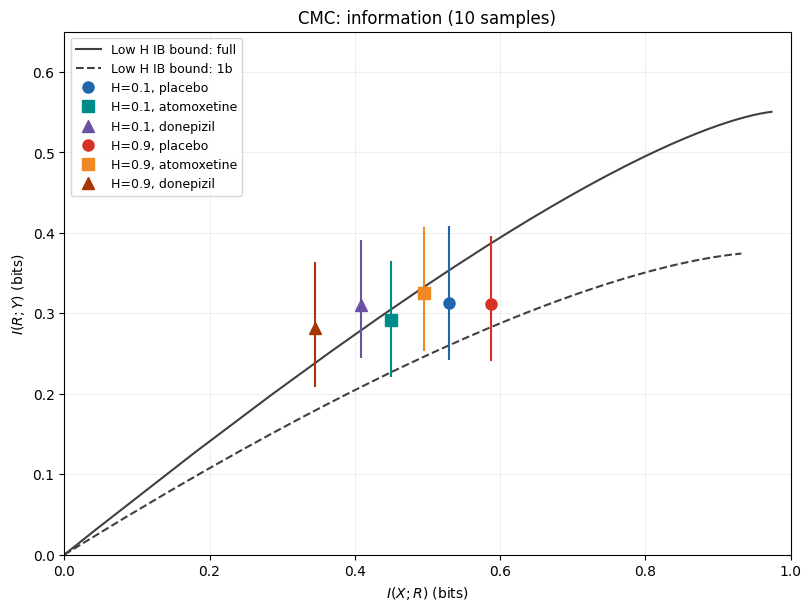

In [10]:
participant = 'CMC'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

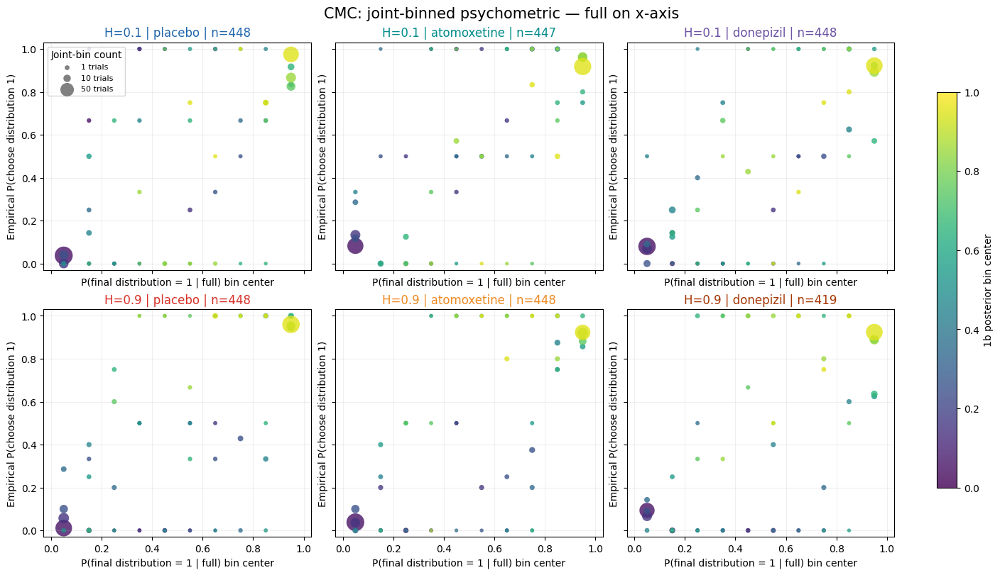

In [11]:
fig = plot_psychometrics('CMC', x_dimension=0)
plt.show()
plt.close(fig)

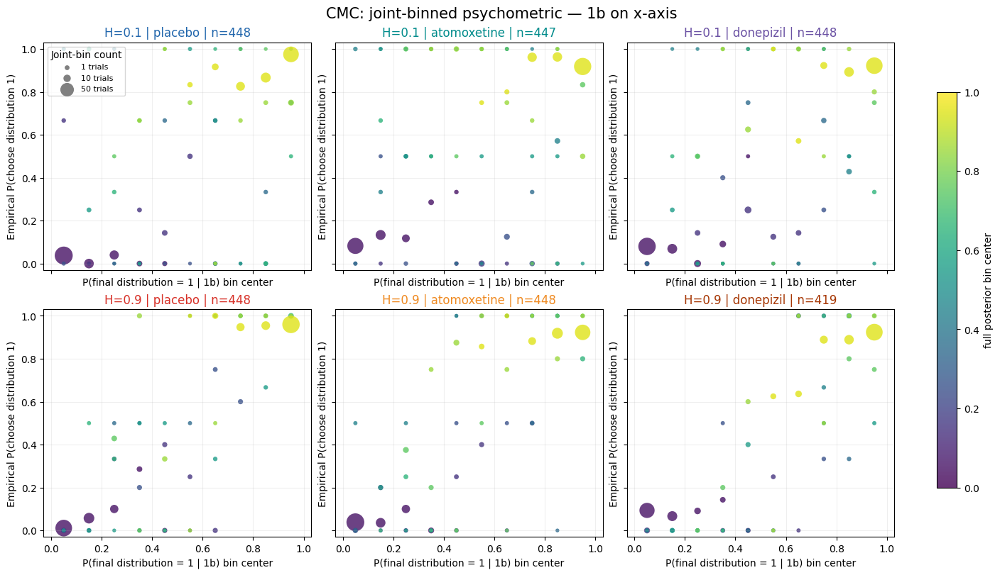

In [12]:
fig = plot_psychometrics('CMC', x_dimension=1)
plt.show()
plt.close(fig)

## Participant CPG

,H,drug,selected_trials,Ixr,Iry
7,0.1,atomoxetine,448,0.666407,0.481455
11,0.1,donepizil,448,0.704867,0.443106
9,0.1,placebo,448,0.669715,0.478353
6,0.9,atomoxetine,448,0.442986,0.201523
10,0.9,donepizil,448,0.513280,0.299070
8,0.9,placebo,448,0.450704,0.259011


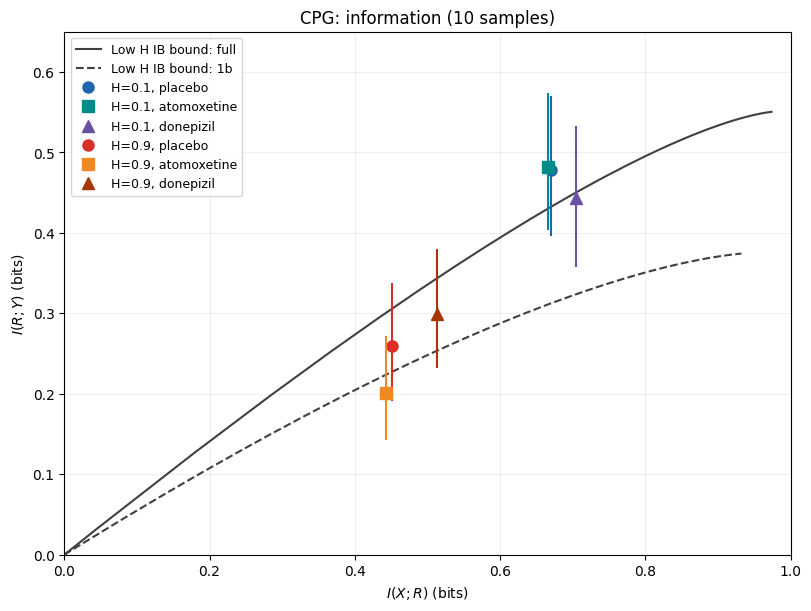

In [13]:
participant = 'CPG'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

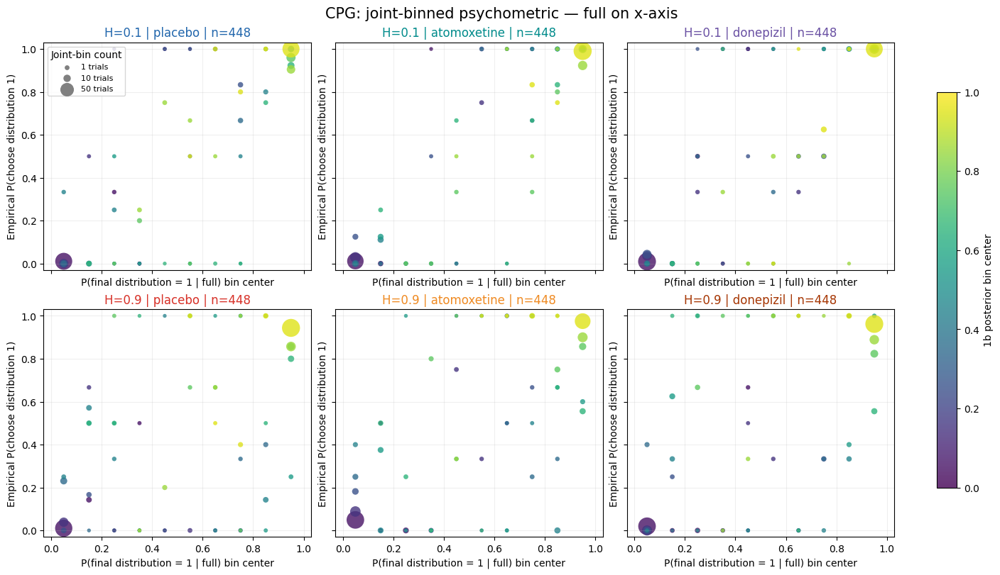

In [14]:
fig = plot_psychometrics('CPG', x_dimension=0)
plt.show()
plt.close(fig)

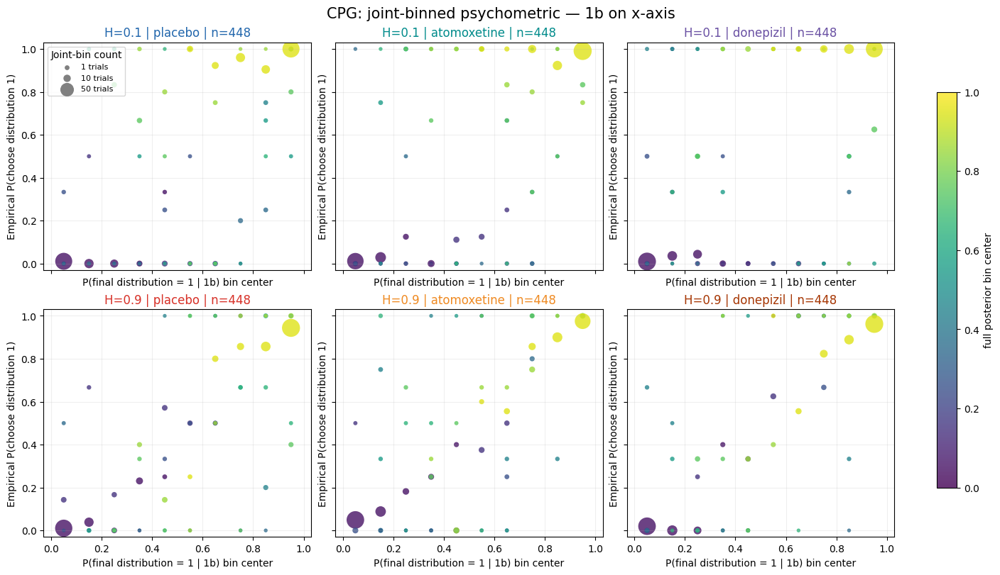

In [15]:
fig = plot_psychometrics('CPG', x_dimension=1)
plt.show()
plt.close(fig)

## Participant CTG

,H,drug,selected_trials,Ixr,Iry
13,0.1,atomoxetine,448,0.758329,0.574429
17,0.1,donepizil,448,0.798779,0.496242
15,0.1,placebo,448,0.648917,0.352415
12,0.9,atomoxetine,448,0.696954,0.413489
16,0.9,donepizil,448,0.568837,0.325568
14,0.9,placebo,448,0.603962,0.387860


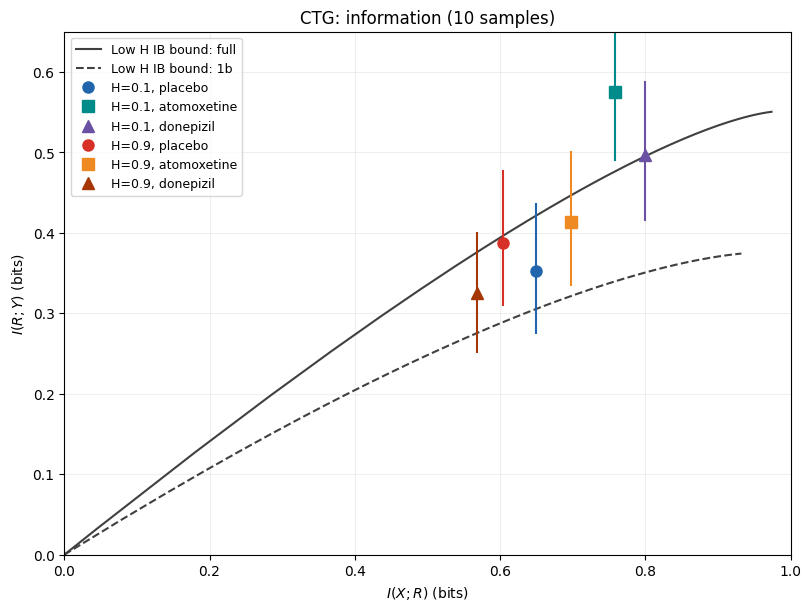

In [16]:
participant = 'CTG'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

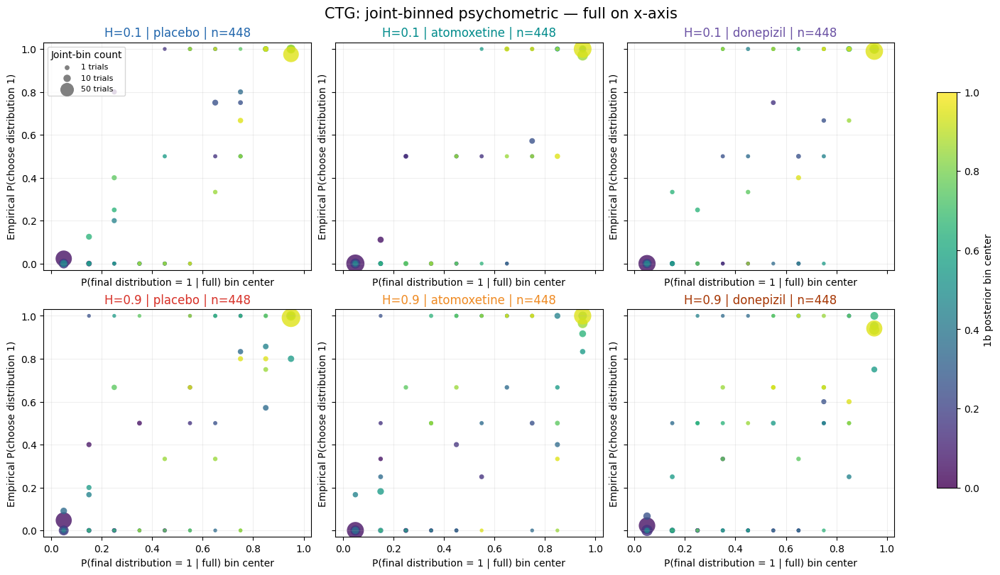

In [17]:
fig = plot_psychometrics('CTG', x_dimension=0)
plt.show()
plt.close(fig)

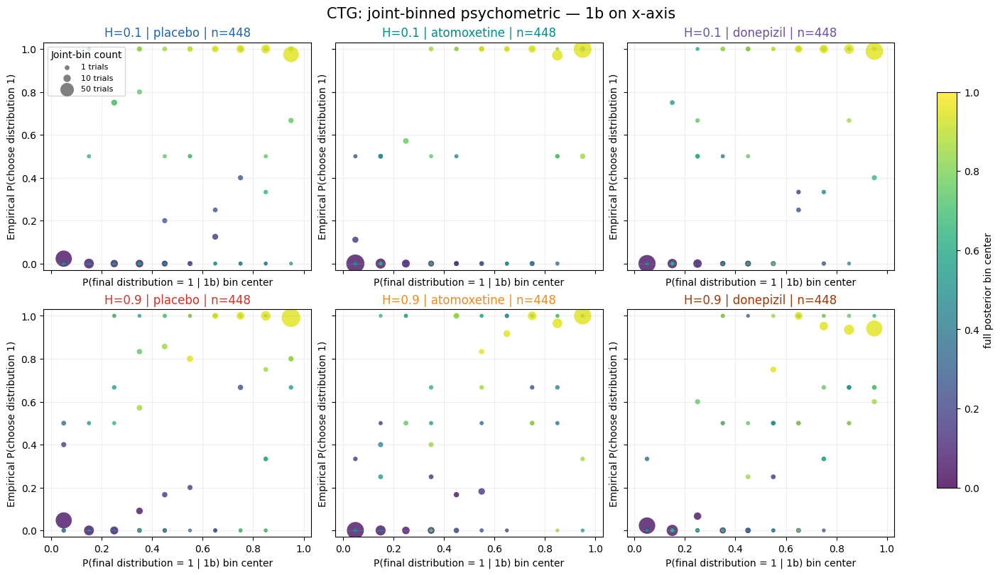

In [18]:
fig = plot_psychometrics('CTG', x_dimension=1)
plt.show()
plt.close(fig)

## Participant CYK

,H,drug,selected_trials,Ixr,Iry
19,0.1,atomoxetine,448,0.855522,0.507176
23,0.1,donepizil,392,0.792767,0.414262
21,0.1,placebo,392,0.745592,0.480361
18,0.9,atomoxetine,448,0.783629,0.293824
22,0.9,donepizil,336,0.716491,0.308971
20,0.9,placebo,392,0.710762,0.382111


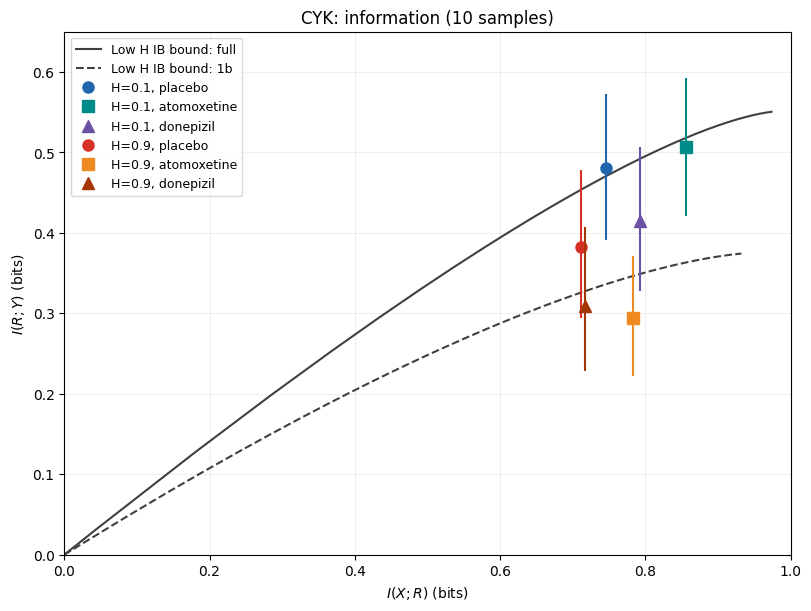

In [19]:
participant = 'CYK'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

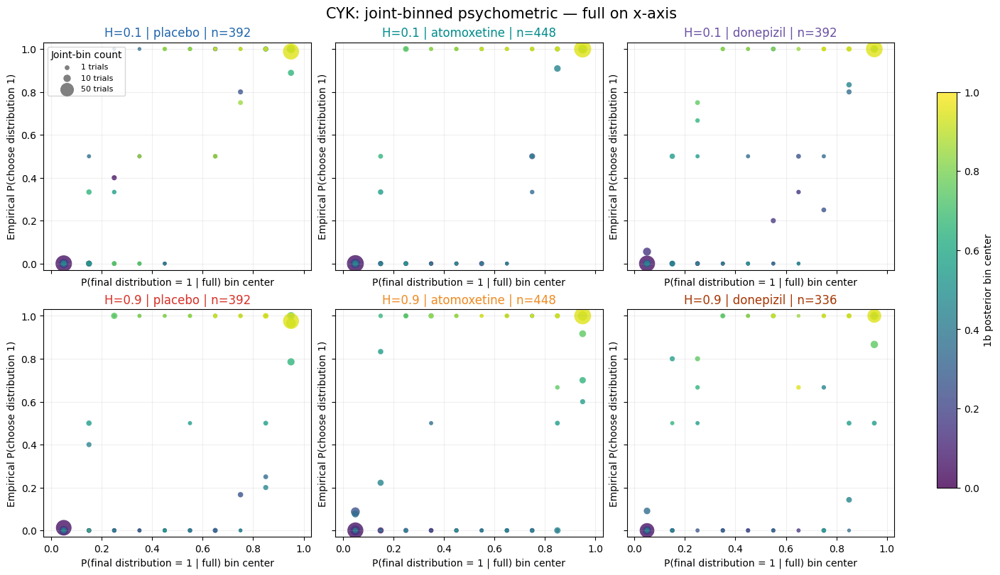

In [20]:
fig = plot_psychometrics('CYK', x_dimension=0)
plt.show()
plt.close(fig)

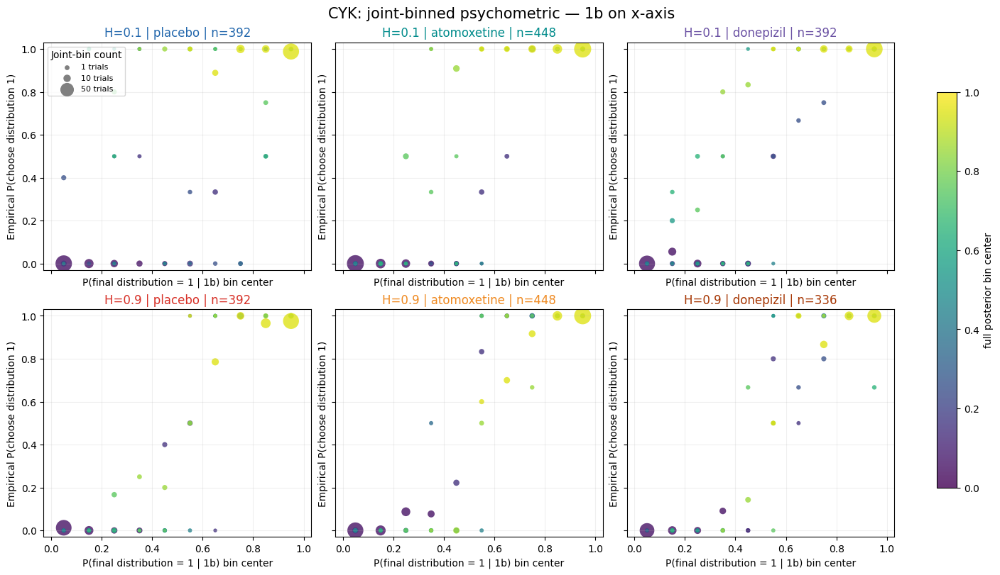

In [21]:
fig = plot_psychometrics('CYK', x_dimension=1)
plt.show()
plt.close(fig)

## Participant EJG

,H,drug,selected_trials,Ixr,Iry
25,0.1,atomoxetine,448,0.670900,0.385840
29,0.1,donepizil,448,0.680536,0.428197
27,0.1,placebo,448,0.690350,0.433037
24,0.9,atomoxetine,448,0.498083,0.288509
28,0.9,donepizil,422,0.609647,0.374137
26,0.9,placebo,448,0.708671,0.374244


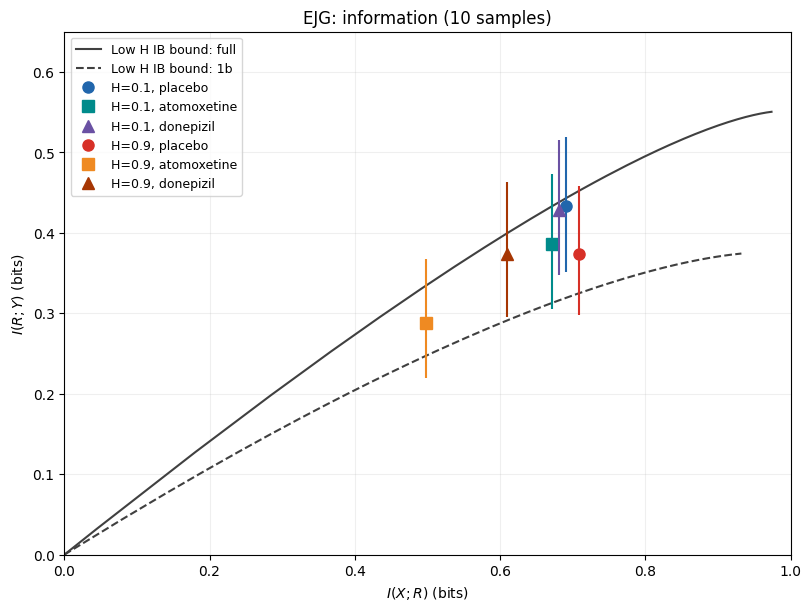

In [22]:
participant = 'EJG'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

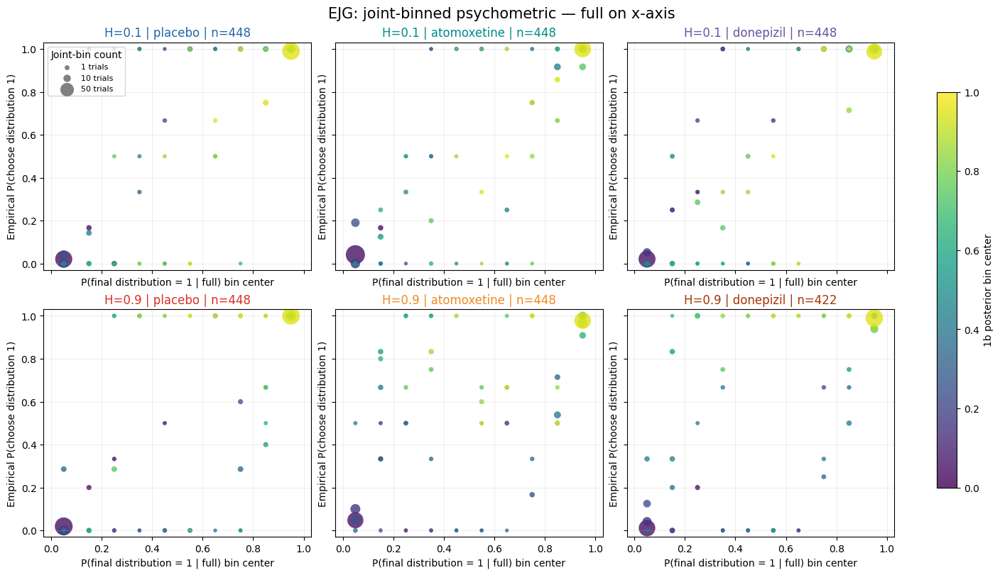

In [23]:
fig = plot_psychometrics('EJG', x_dimension=0)
plt.show()
plt.close(fig)

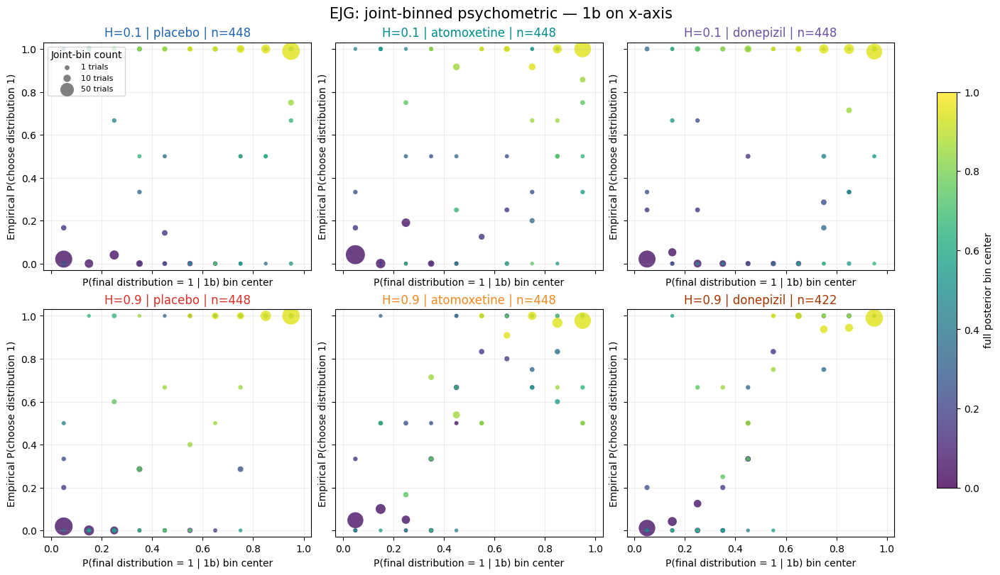

In [24]:
fig = plot_psychometrics('EJG', x_dimension=1)
plt.show()
plt.close(fig)

## Participant FDC

,H,drug,selected_trials,Ixr,Iry
31,0.1,atomoxetine,389,0.522264,0.267593
35,0.1,donepizil,448,0.725867,0.503538
33,0.1,placebo,448,0.649300,0.354286
30,0.9,atomoxetine,334,0.659992,0.324492
34,0.9,donepizil,447,0.714047,0.325990
32,0.9,placebo,390,0.585381,0.279964


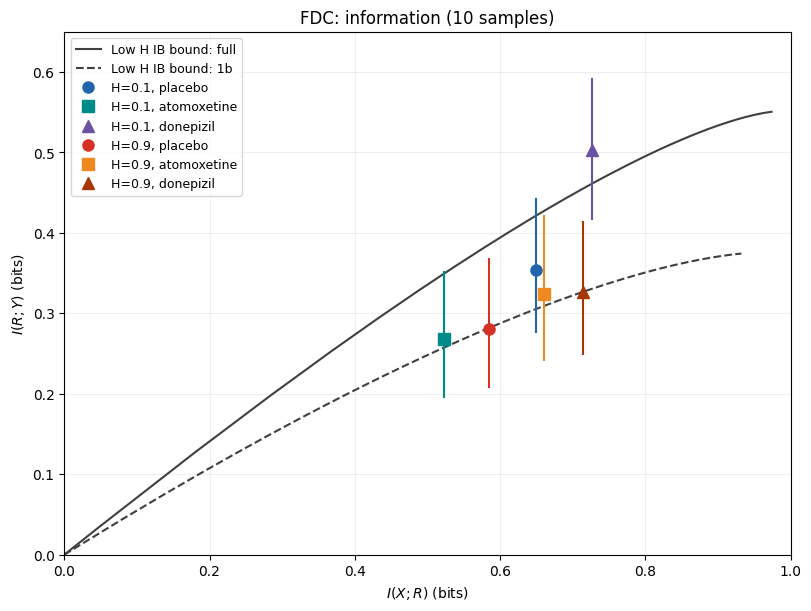

In [25]:
participant = 'FDC'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

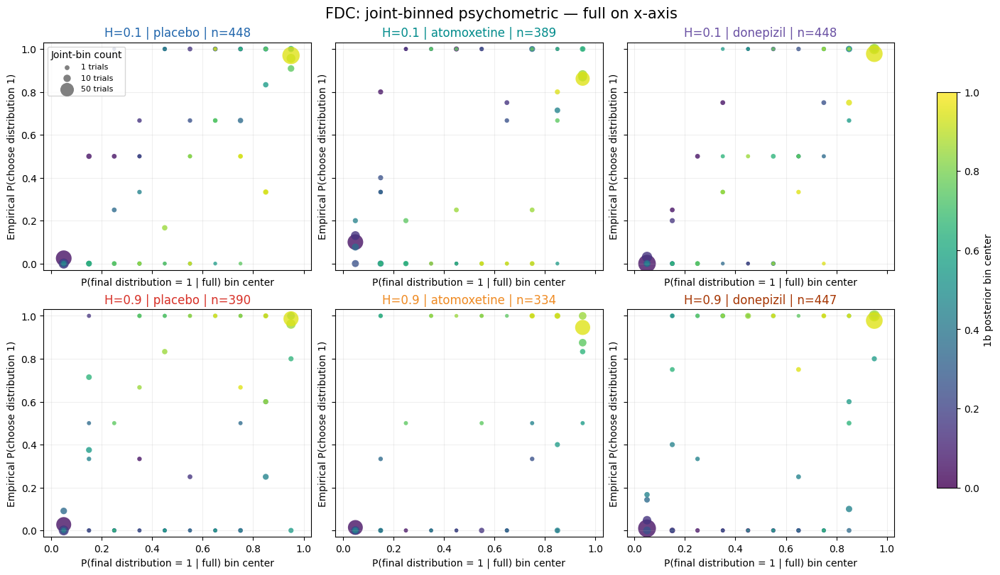

In [26]:
fig = plot_psychometrics('FDC', x_dimension=0)
plt.show()
plt.close(fig)

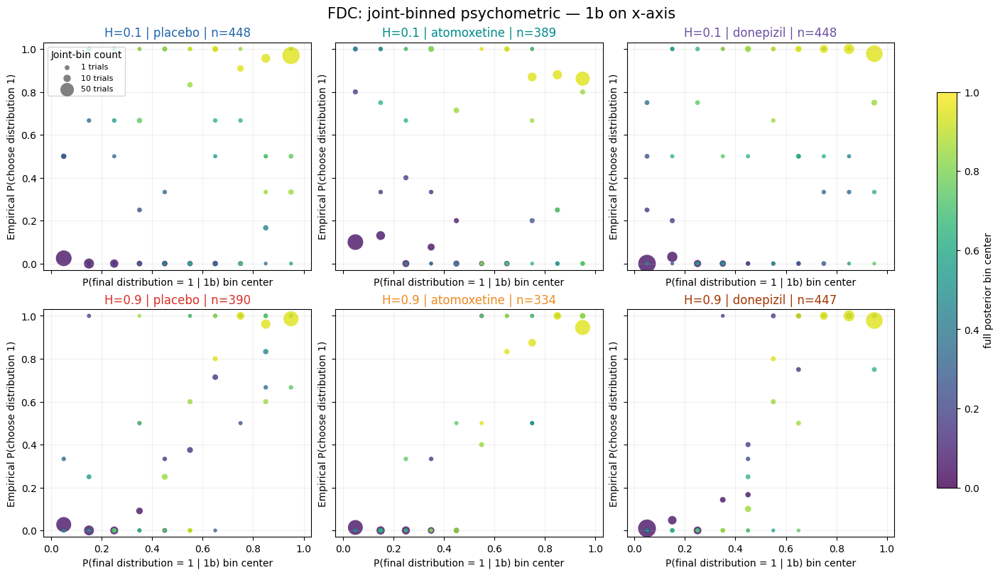

In [27]:
fig = plot_psychometrics('FDC', x_dimension=1)
plt.show()
plt.close(fig)

## Participant FLW

,H,drug,selected_trials,Ixr,Iry
37,0.1,atomoxetine,448,0.782382,0.450753
41,0.1,donepizil,418,0.759456,0.499721
39,0.1,placebo,448,0.778175,0.431178
36,0.9,atomoxetine,421,0.415362,0.272687
40,0.9,donepizil,419,0.335444,0.305792
38,0.9,placebo,448,0.506952,0.397570


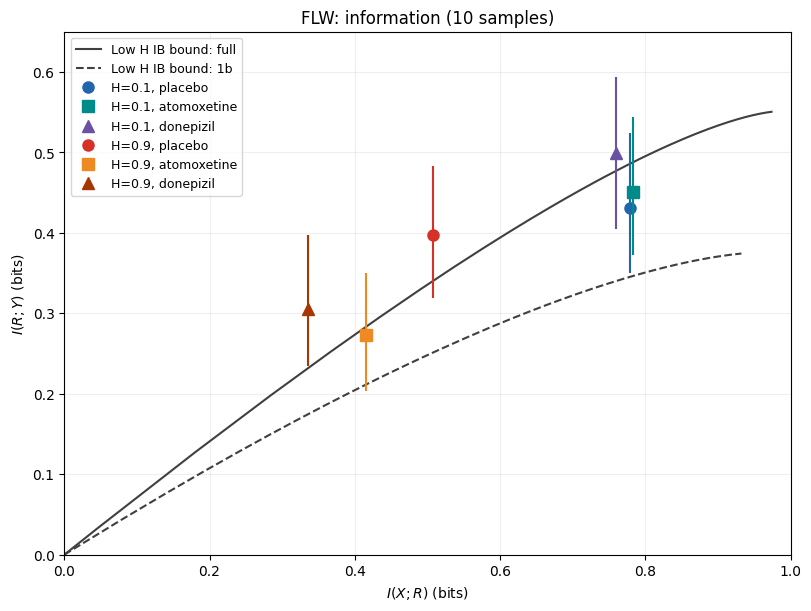

In [28]:
participant = 'FLW'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

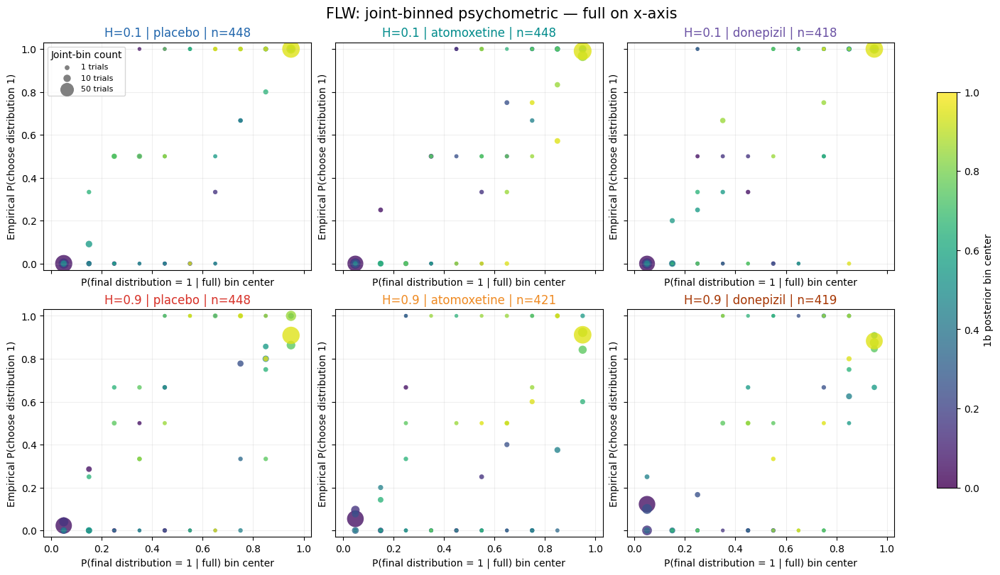

In [29]:
fig = plot_psychometrics('FLW', x_dimension=0)
plt.show()
plt.close(fig)

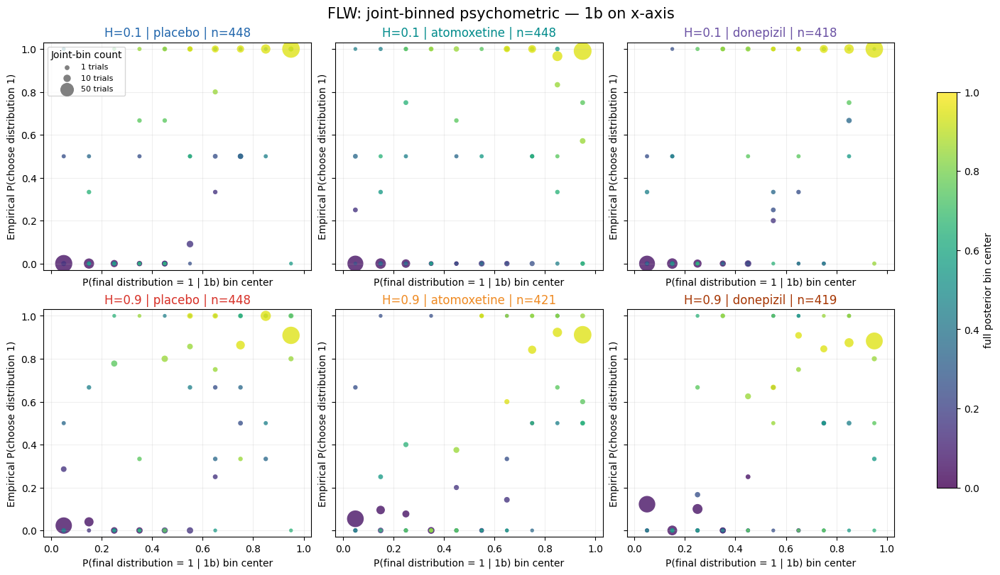

In [30]:
fig = plot_psychometrics('FLW', x_dimension=1)
plt.show()
plt.close(fig)

## Participant FNC

,H,drug,selected_trials,Ixr,Iry
43,0.1,atomoxetine,448,0.830815,0.503281
47,0.1,donepizil,448,0.828209,0.485607
45,0.1,placebo,448,0.790746,0.425255
42,0.9,atomoxetine,448,0.672985,0.270391
46,0.9,donepizil,448,0.617142,0.312455
44,0.9,placebo,448,0.703498,0.273838


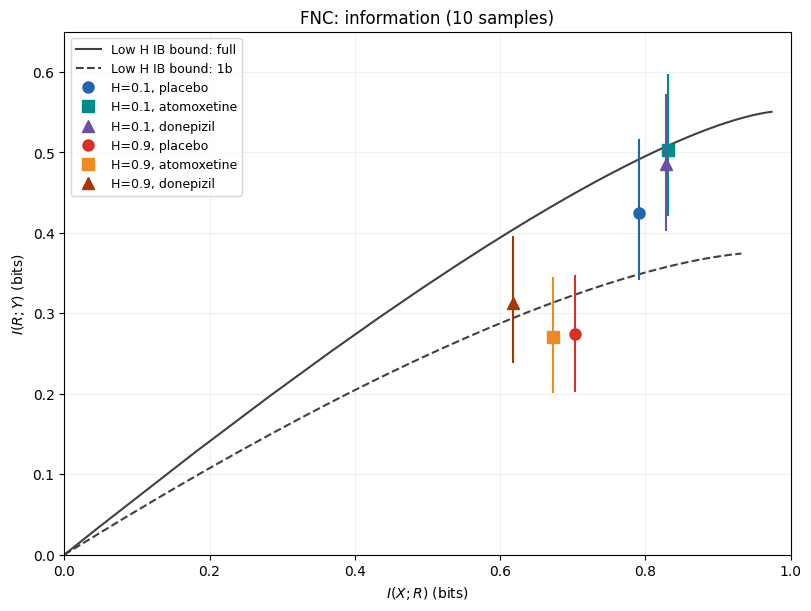

In [31]:
participant = 'FNC'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

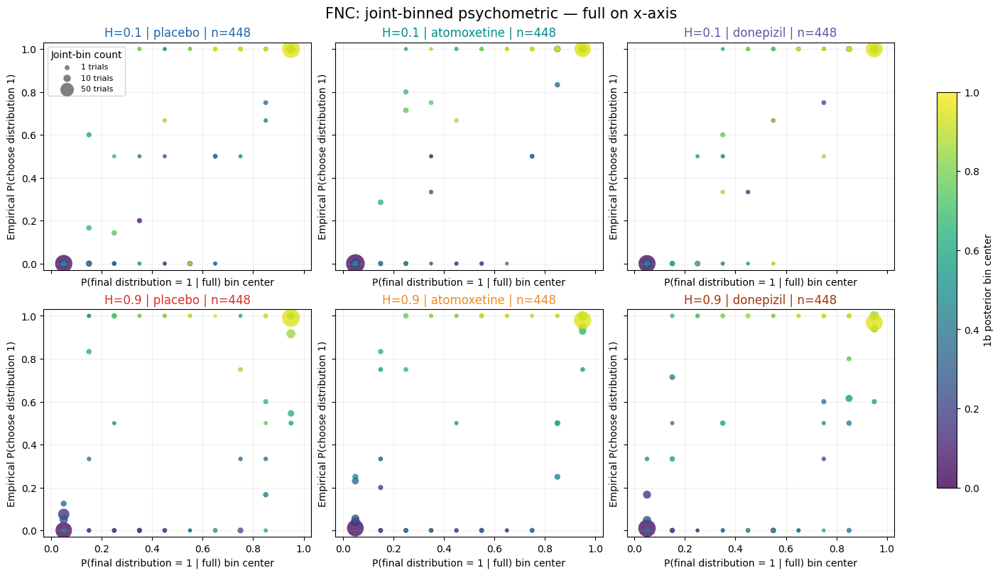

In [32]:
fig = plot_psychometrics('FNC', x_dimension=0)
plt.show()
plt.close(fig)

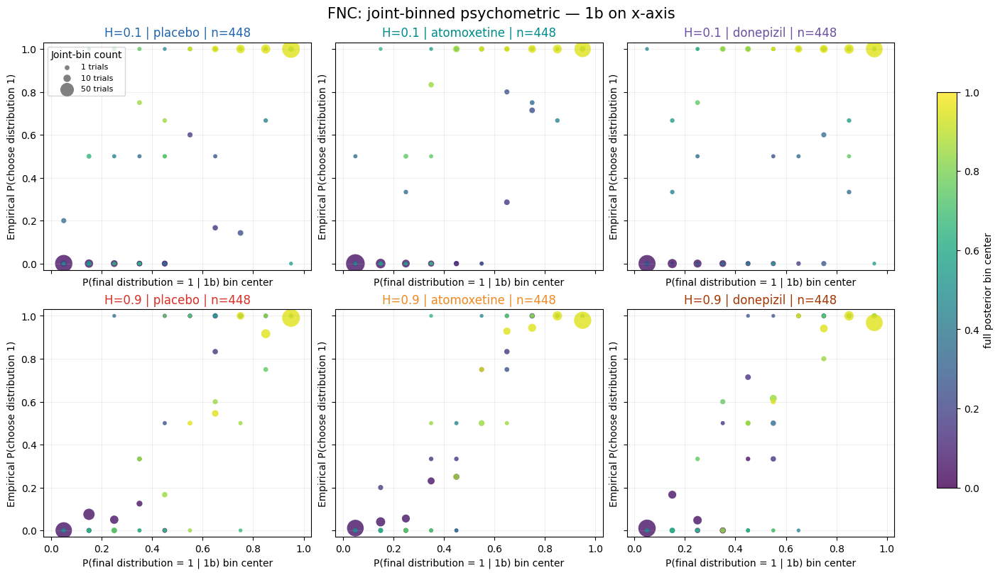

In [33]:
fig = plot_psychometrics('FNC', x_dimension=1)
plt.show()
plt.close(fig)

## Participant GHT

,H,drug,selected_trials,Ixr,Iry
49,0.1,atomoxetine,448,0.807093,0.542294
53,0.1,donepizil,447,0.777607,0.502461
51,0.1,placebo,448,0.718784,0.512035
48,0.9,atomoxetine,616,0.632955,0.367721
52,0.9,donepizil,448,0.451447,0.249515
50,0.9,placebo,448,0.408029,0.214708


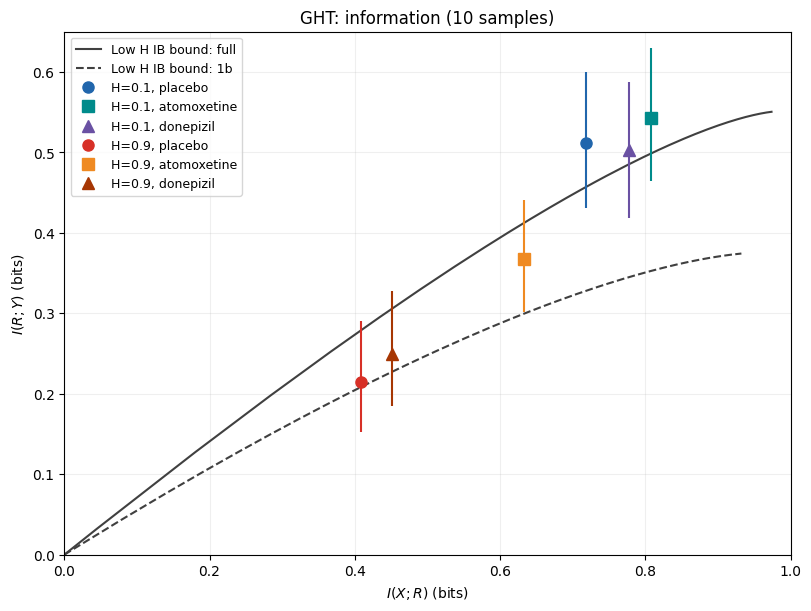

In [34]:
participant = 'GHT'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

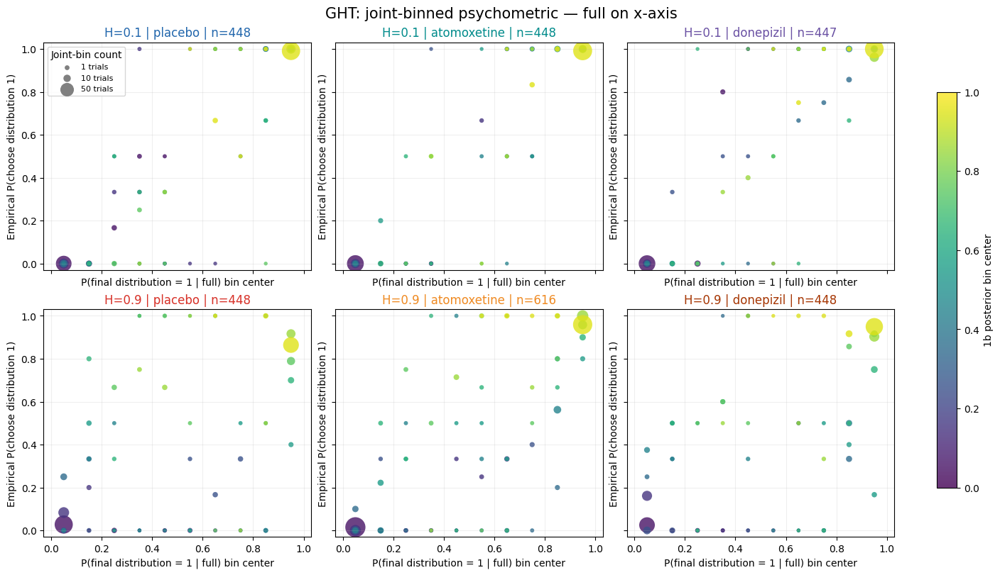

In [35]:
fig = plot_psychometrics('GHT', x_dimension=0)
plt.show()
plt.close(fig)

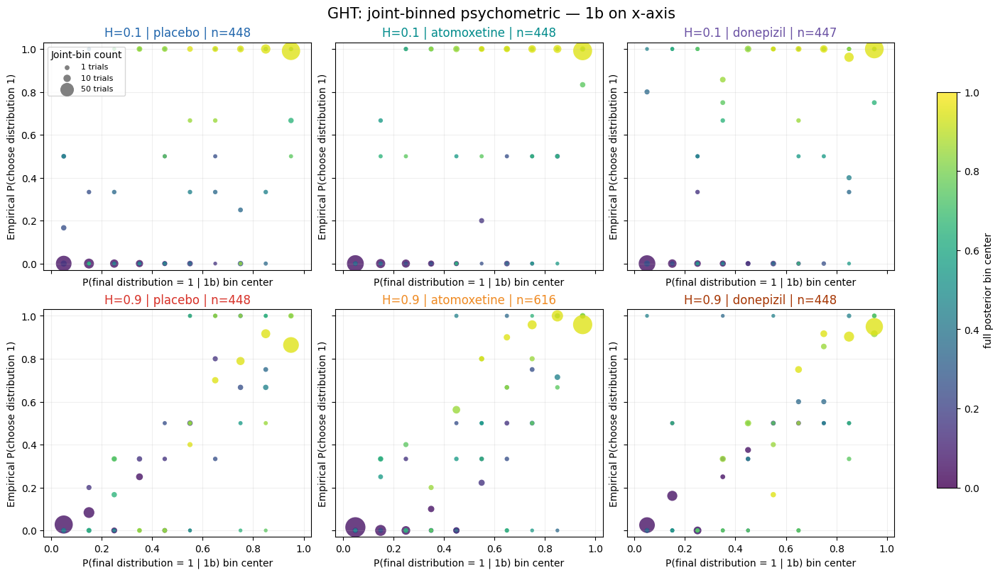

In [36]:
fig = plot_psychometrics('GHT', x_dimension=1)
plt.show()
plt.close(fig)

## Participant HFK

,H,drug,selected_trials,Ixr,Iry
55,0.1,atomoxetine,418,0.602060,0.329126
59,0.1,donepizil,392,0.681000,0.470479
57,0.1,placebo,392,0.519733,0.375872
54,0.9,atomoxetine,392,0.356846,0.268623
58,0.9,donepizil,392,0.287237,0.215515
56,0.9,placebo,438,0.189718,0.086356


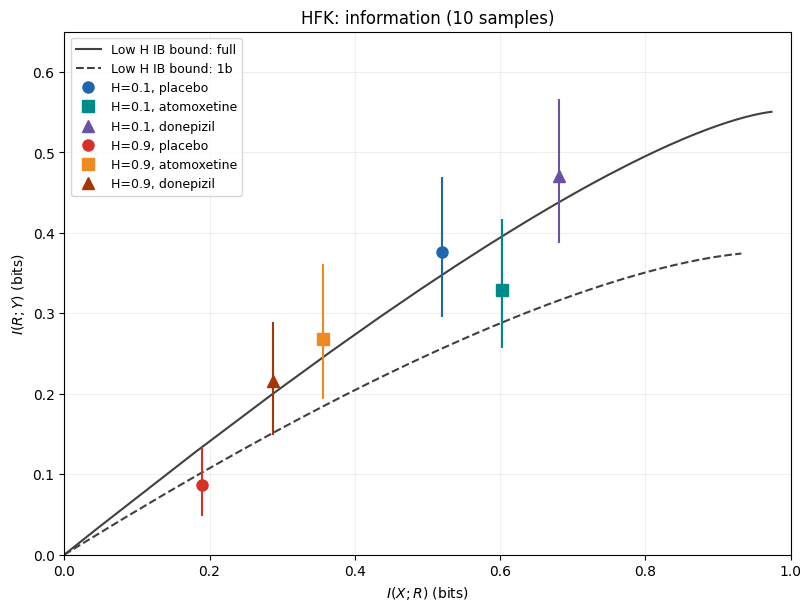

In [37]:
participant = 'HFK'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

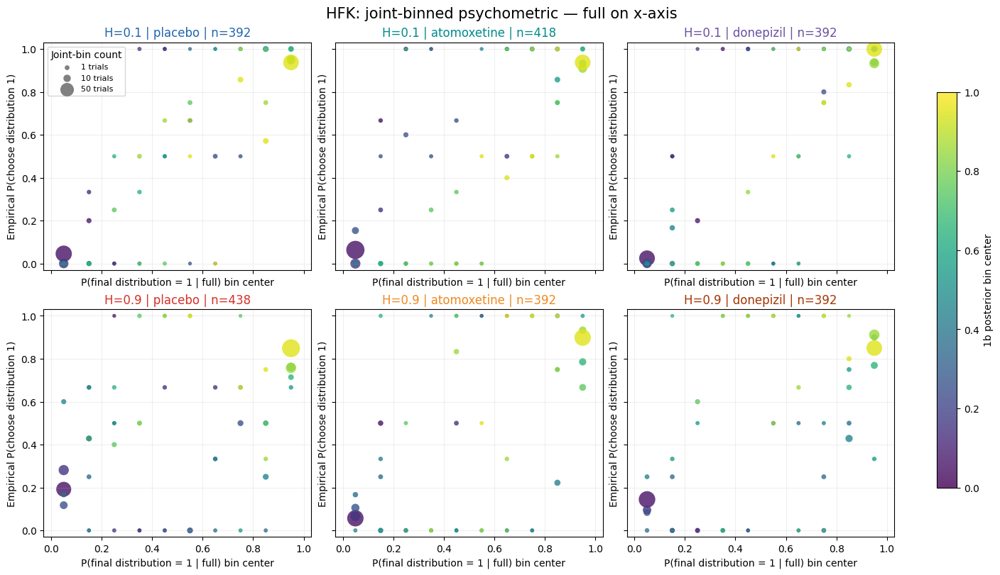

In [38]:
fig = plot_psychometrics('HFK', x_dimension=0)
plt.show()
plt.close(fig)

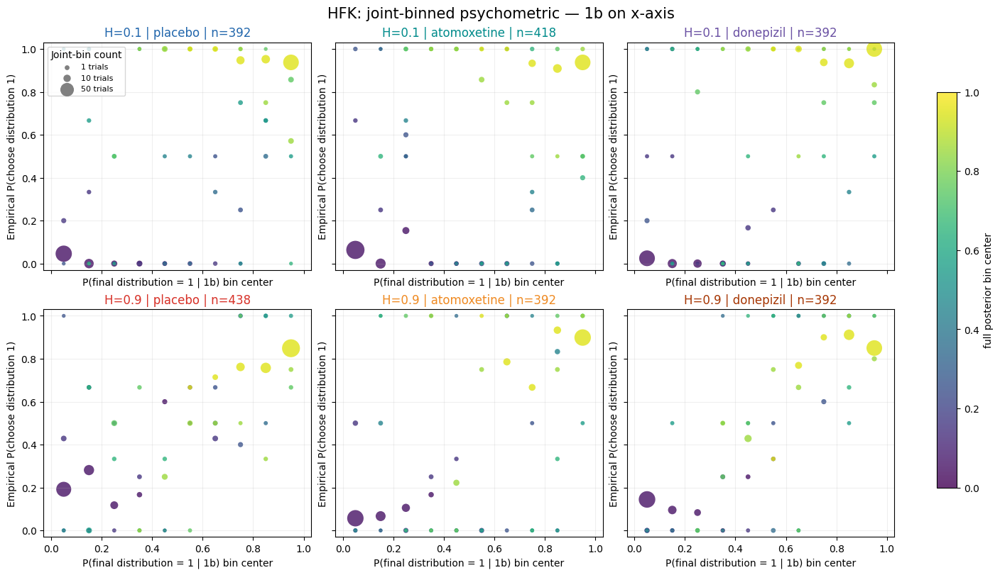

In [39]:
fig = plot_psychometrics('HFK', x_dimension=1)
plt.show()
plt.close(fig)

## Participant HOG

,H,drug,selected_trials,Ixr,Iry
61,0.1,atomoxetine,448,0.707861,0.377341
65,0.1,donepizil,448,0.761588,0.414860
63,0.1,placebo,448,0.794739,0.508455
60,0.9,atomoxetine,448,0.467017,0.303431
64,0.9,donepizil,448,0.555948,0.233077
62,0.9,placebo,448,0.649558,0.368298


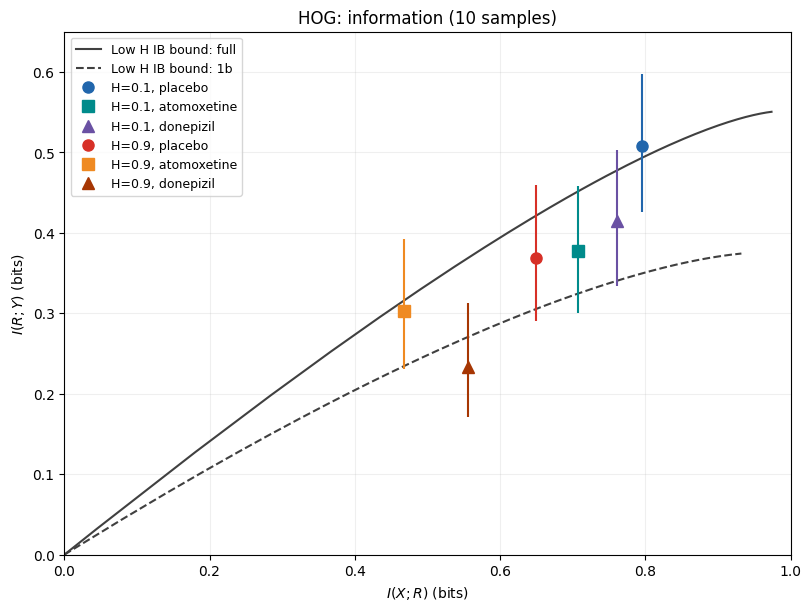

In [40]:
participant = 'HOG'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

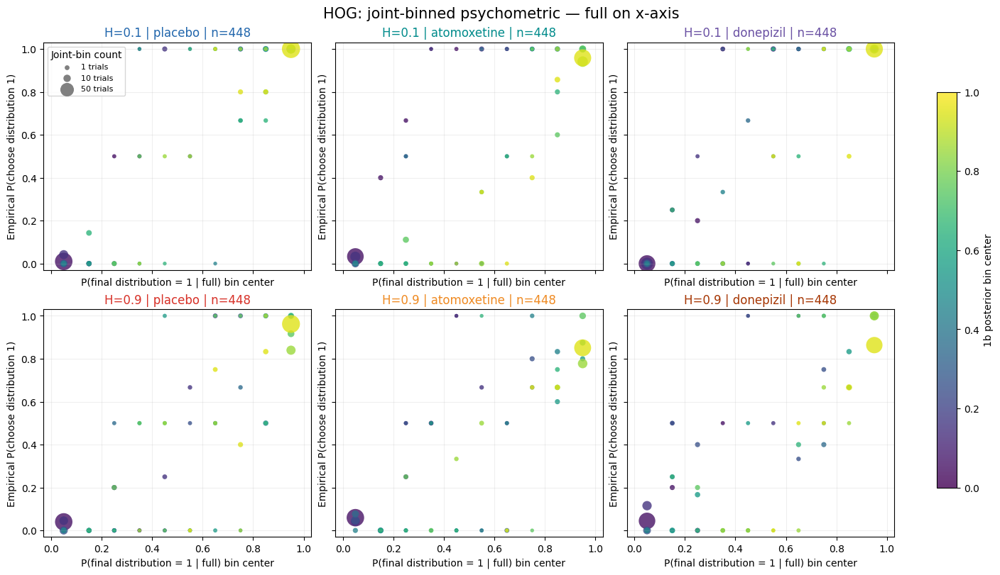

In [41]:
fig = plot_psychometrics('HOG', x_dimension=0)
plt.show()
plt.close(fig)

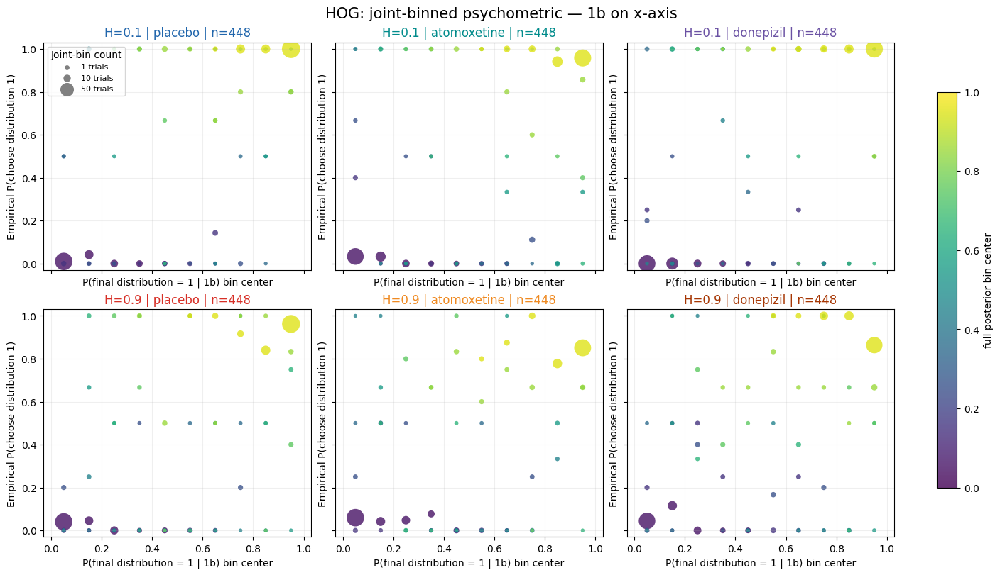

In [42]:
fig = plot_psychometrics('HOG', x_dimension=1)
plt.show()
plt.close(fig)

## Participant ICD

,H,drug,selected_trials,Ixr,Iry
67,0.1,atomoxetine,448,0.823055,0.407232
71,0.1,donepizil,419,0.839233,0.300256
69,0.1,placebo,431,0.771378,0.356686
66,0.9,atomoxetine,420,0.696146,0.359351
70,0.9,donepizil,448,0.665096,0.337521
68,0.9,placebo,421,0.777196,0.371523


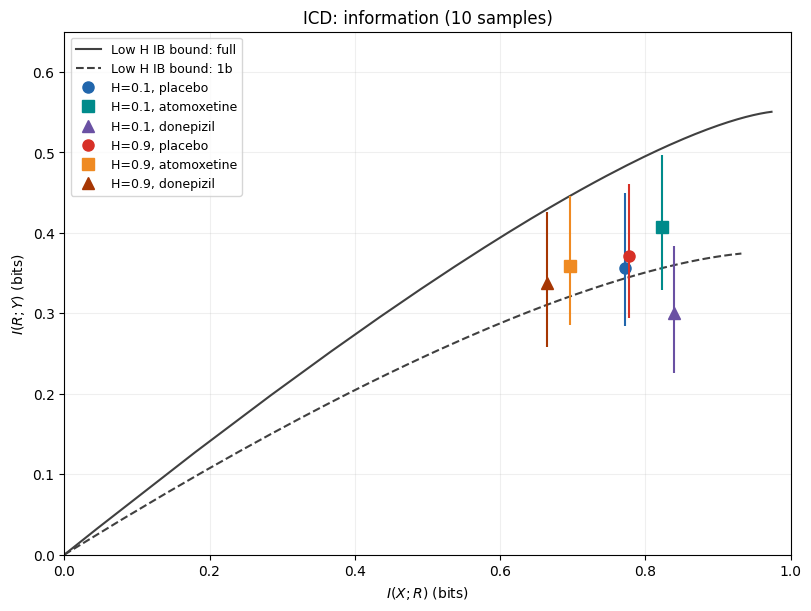

In [43]:
participant = 'ICD'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

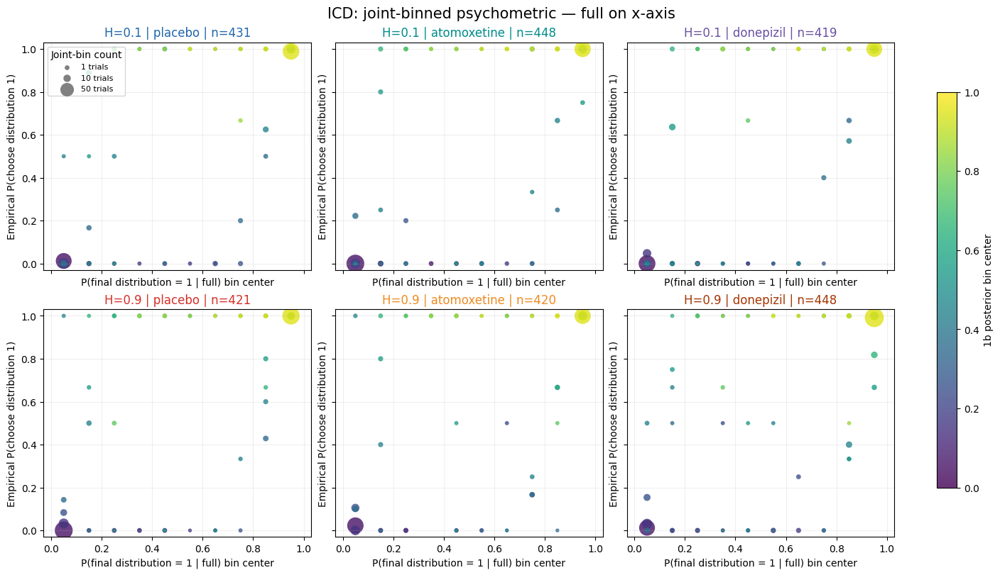

In [44]:
fig = plot_psychometrics('ICD', x_dimension=0)
plt.show()
plt.close(fig)

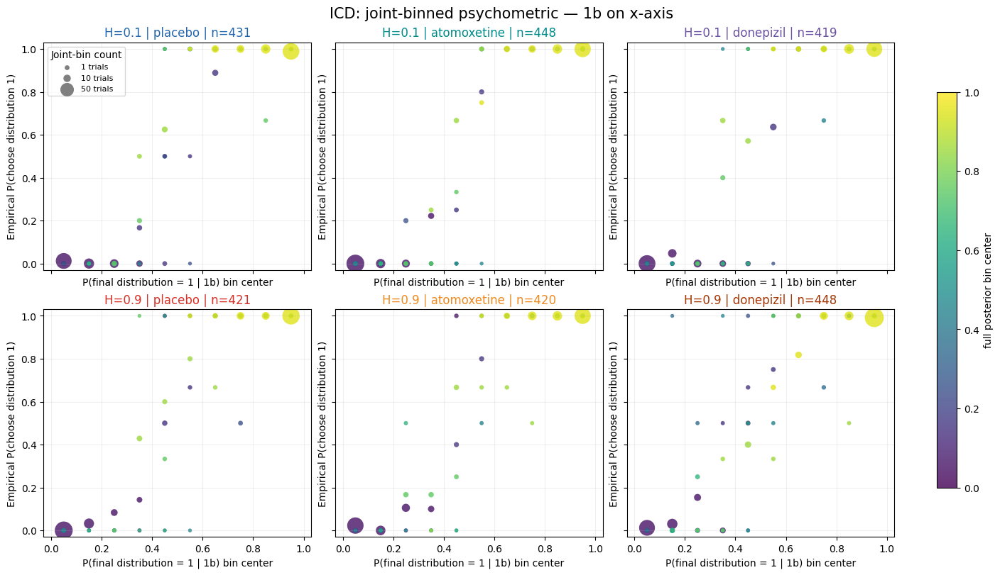

In [45]:
fig = plot_psychometrics('ICD', x_dimension=1)
plt.show()
plt.close(fig)

## Participant JPK

,H,drug,selected_trials,Ixr,Iry
73,0.1,atomoxetine,448,0.800725,0.333645
77,0.1,donepizil,448,0.848091,0.293395
75,0.1,placebo,448,0.887734,0.475901
72,0.9,atomoxetine,448,0.927874,0.438080
76,0.9,donepizil,448,0.846814,0.381180
74,0.9,placebo,448,0.845300,0.390454


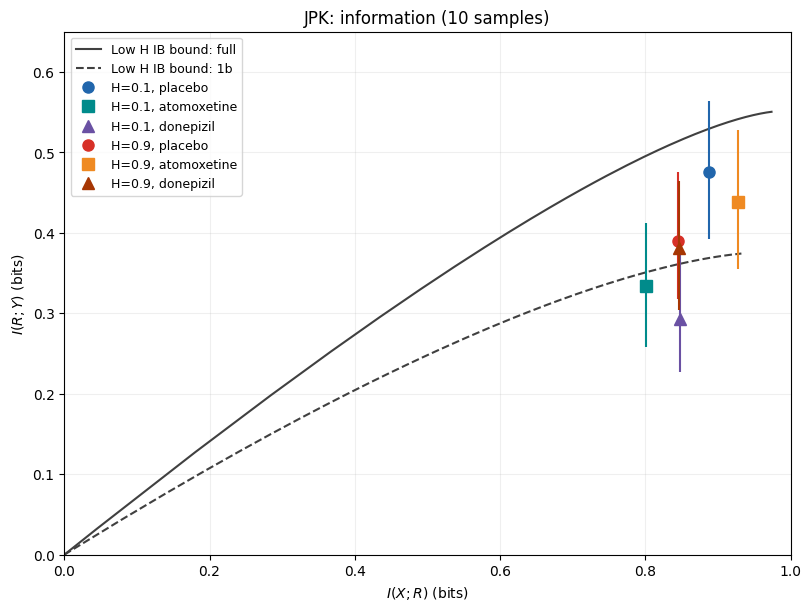

In [46]:
participant = 'JPK'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

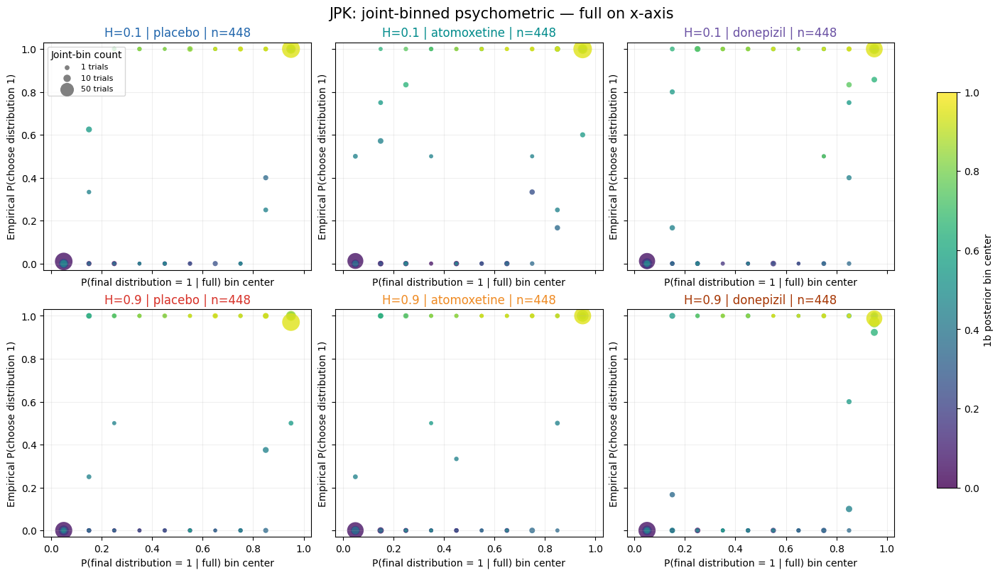

In [47]:
fig = plot_psychometrics('JPK', x_dimension=0)
plt.show()
plt.close(fig)

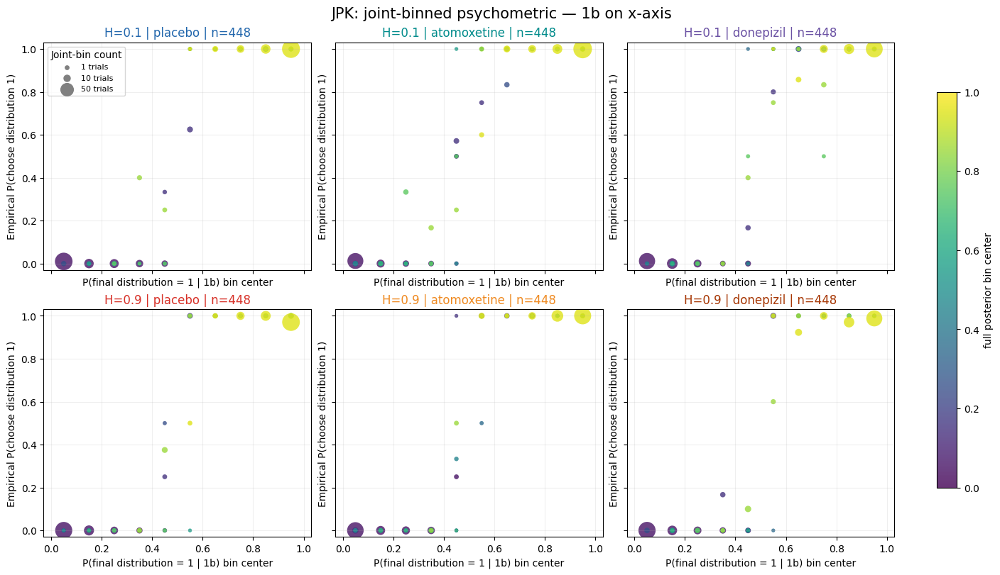

In [48]:
fig = plot_psychometrics('JPK', x_dimension=1)
plt.show()
plt.close(fig)

## Participant LOK

,H,drug,selected_trials,Ixr,Iry
79,0.1,atomoxetine,448,0.659905,0.476030
83,0.1,donepizil,448,0.719082,0.457316
81,0.1,placebo,447,0.718959,0.482785
78,0.9,atomoxetine,448,0.710960,0.425176
82,0.9,donepizil,448,0.652084,0.461168
80,0.9,placebo,448,0.663288,0.381783


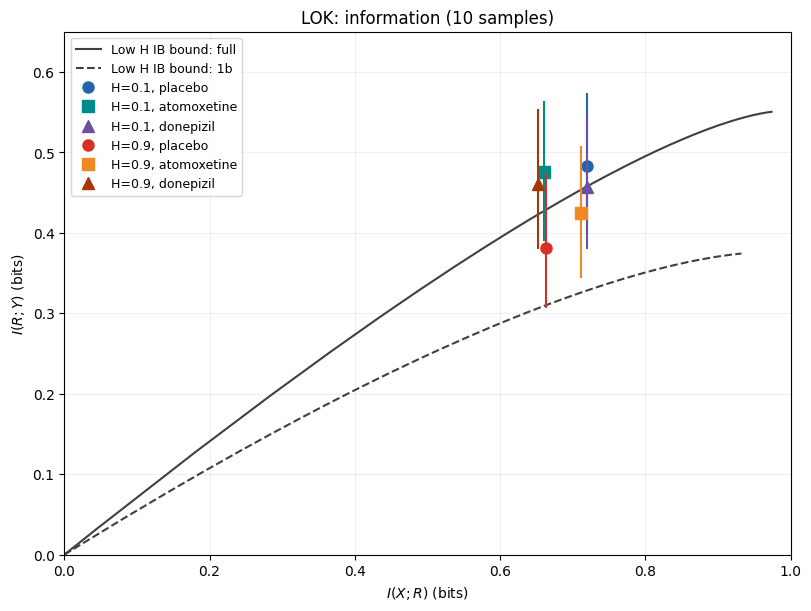

In [49]:
participant = 'LOK'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

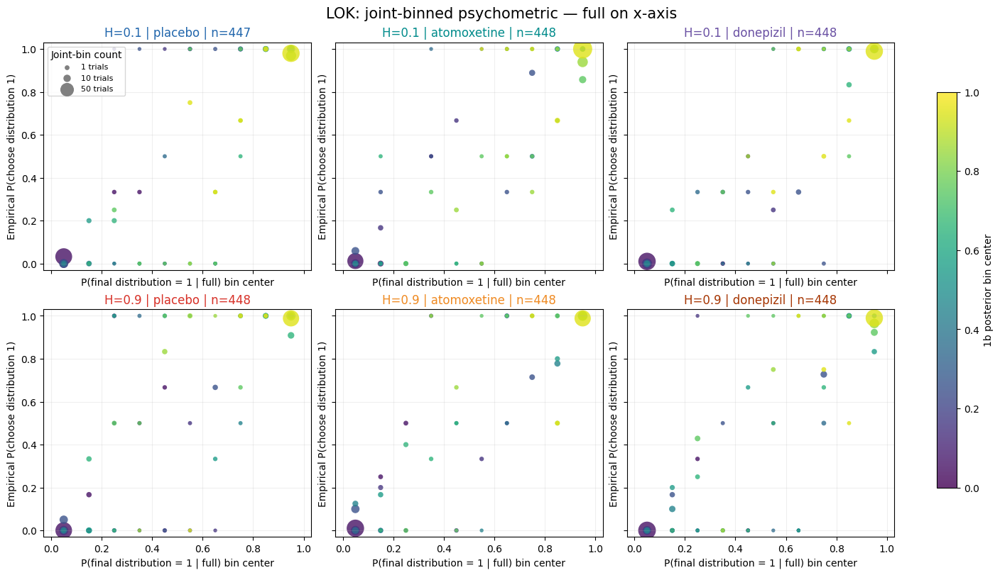

In [50]:
fig = plot_psychometrics('LOK', x_dimension=0)
plt.show()
plt.close(fig)

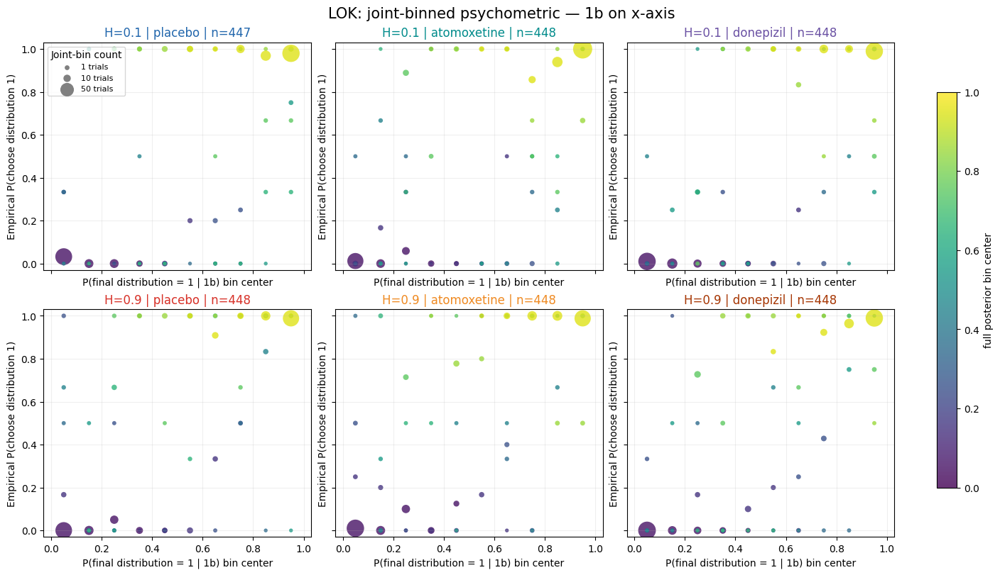

In [51]:
fig = plot_psychometrics('LOK', x_dimension=1)
plt.show()
plt.close(fig)

## Participant MDC

,H,drug,selected_trials,Ixr,Iry
85,0.1,atomoxetine,447,0.768742,0.456520
89,0.1,donepizil,409,0.721516,0.463678
87,0.1,placebo,448,0.790195,0.508774
84,0.9,atomoxetine,448,0.569414,0.323655
88,0.9,donepizil,447,0.603310,0.400922
86,0.9,placebo,448,0.752109,0.464270


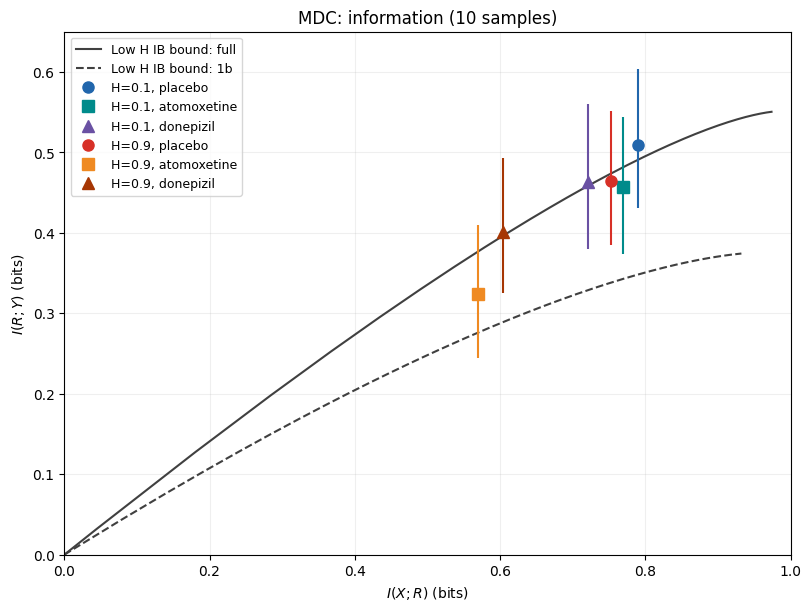

In [52]:
participant = 'MDC'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

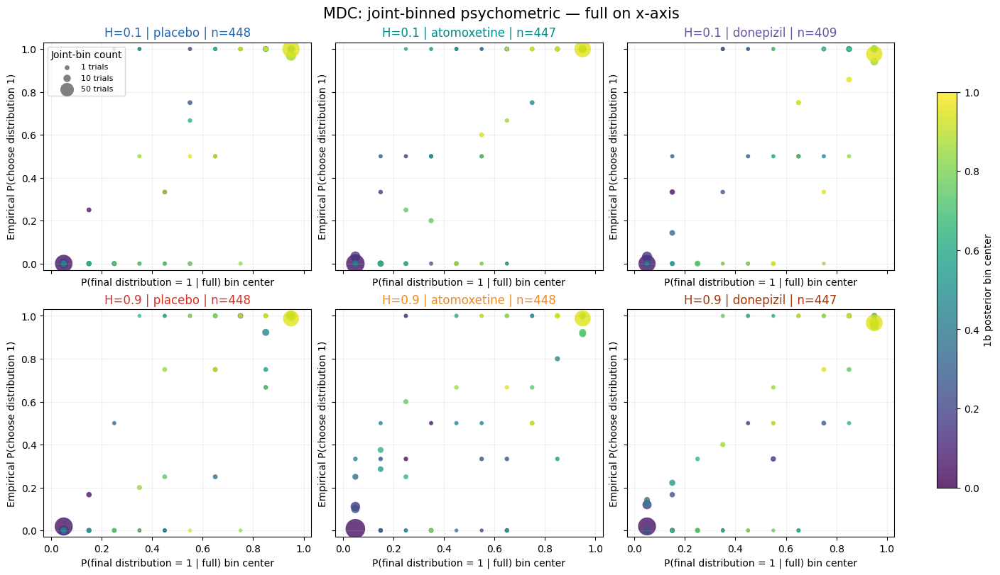

In [53]:
fig = plot_psychometrics('MDC', x_dimension=0)
plt.show()
plt.close(fig)

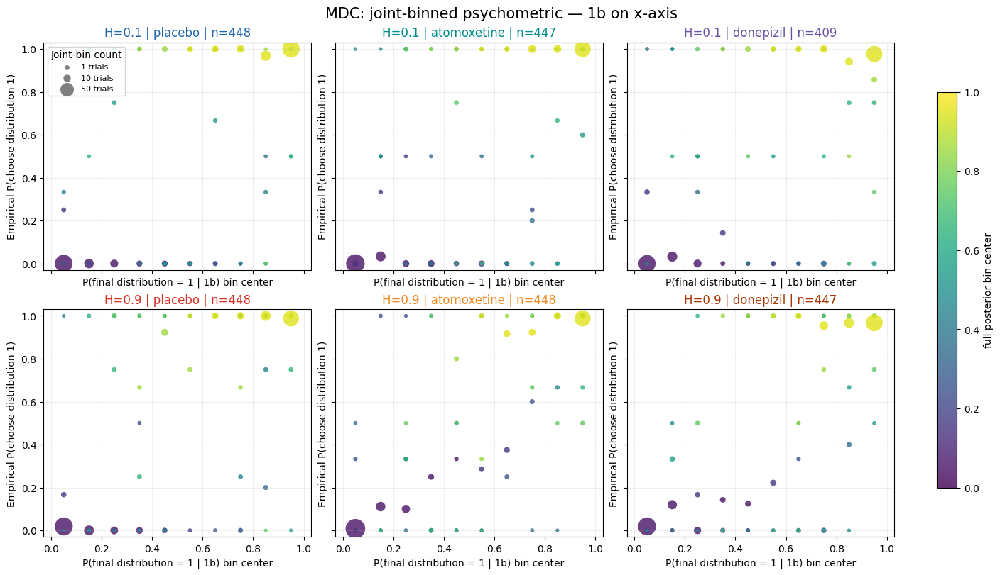

In [54]:
fig = plot_psychometrics('MDC', x_dimension=1)
plt.show()
plt.close(fig)

## Participant MJQ

,H,drug,selected_trials,Ixr,Iry
91,0.1,atomoxetine,448,0.811344,0.521158
95,0.1,donepizil,448,0.766458,0.460327
93,0.1,placebo,448,0.743940,0.494314
90,0.9,atomoxetine,448,0.700221,0.347037
94,0.9,donepizil,447,0.670441,0.343039
92,0.9,placebo,448,0.702122,0.413250


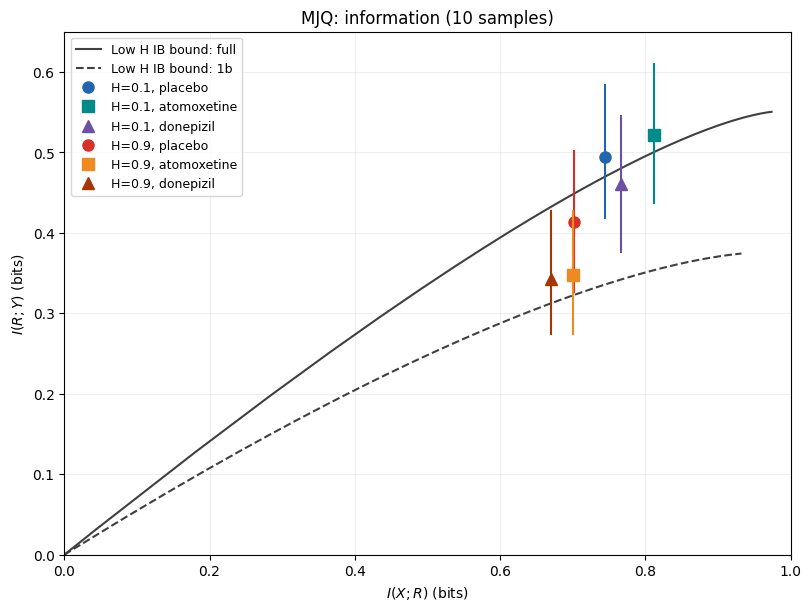

In [55]:
participant = 'MJQ'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

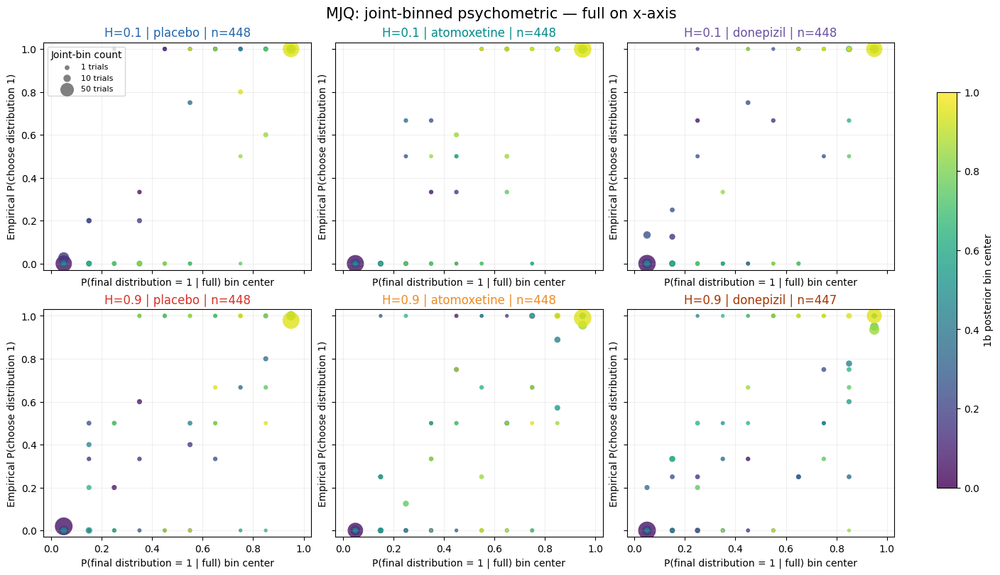

In [56]:
fig = plot_psychometrics('MJQ', x_dimension=0)
plt.show()
plt.close(fig)

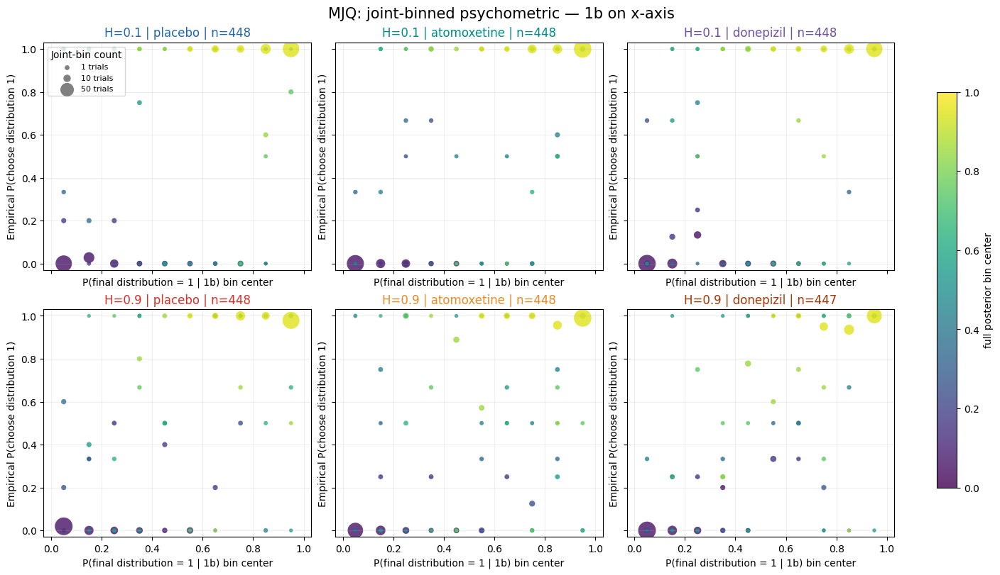

In [57]:
fig = plot_psychometrics('MJQ', x_dimension=1)
plt.show()
plt.close(fig)

## Participant MLC

,H,drug,selected_trials,Ixr,Iry
97,0.1,atomoxetine,413,0.717428,0.489802
101,0.1,donepizil,417,0.793003,0.545943
99,0.1,placebo,392,0.678446,0.411251
96,0.9,atomoxetine,421,0.440146,0.308679
100,0.9,donepizil,421,0.400456,0.267949
98,0.9,placebo,392,0.521335,0.413524


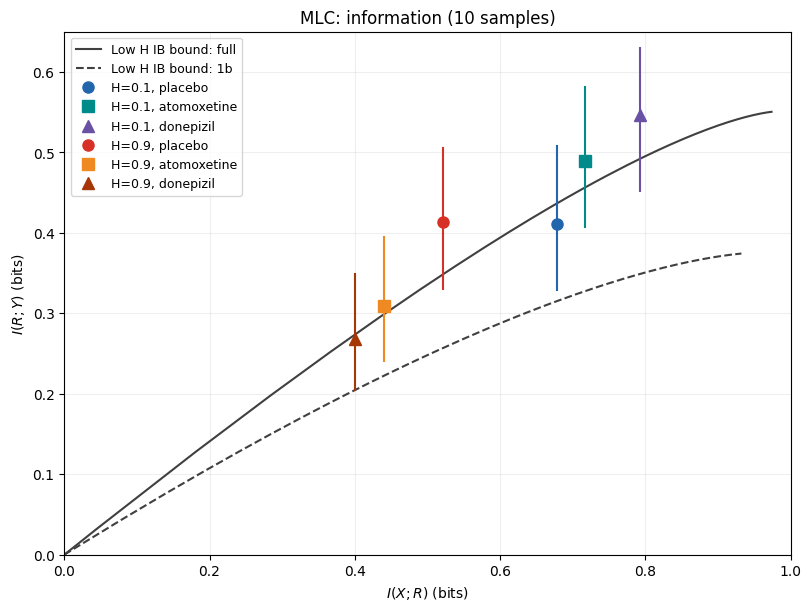

In [58]:
participant = 'MLC'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

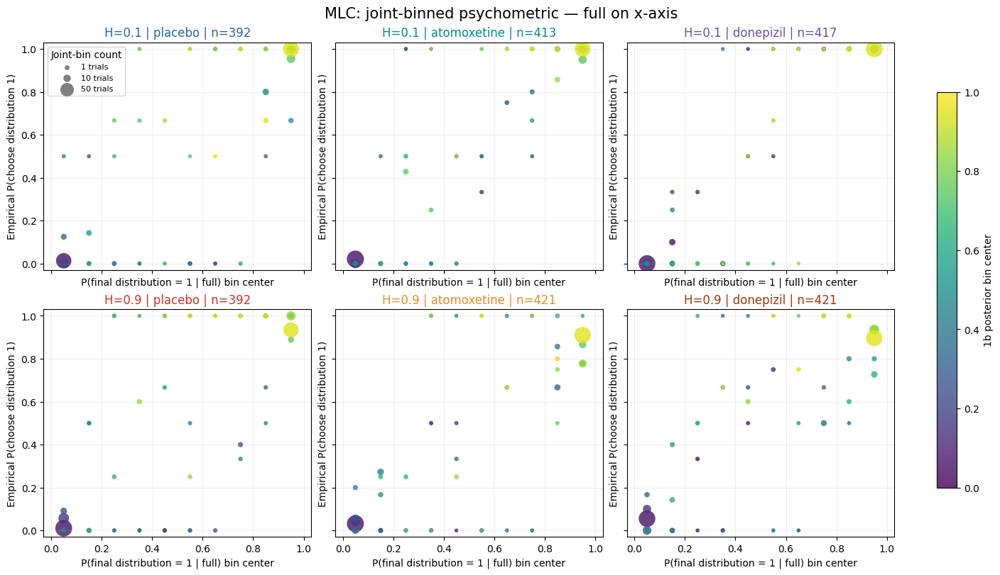

In [59]:
fig = plot_psychometrics('MLC', x_dimension=0)
plt.show()
plt.close(fig)

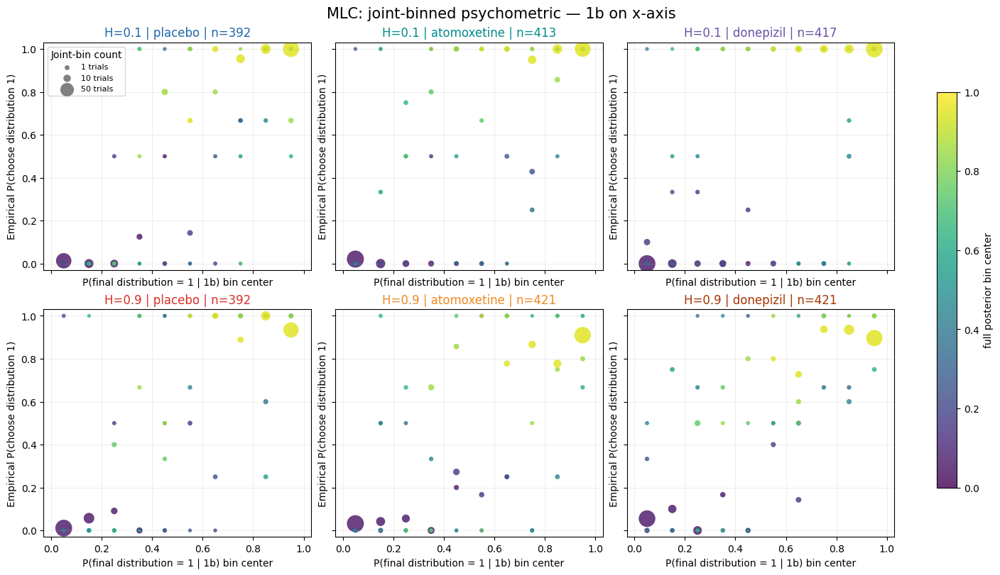

In [60]:
fig = plot_psychometrics('MLC', x_dimension=1)
plt.show()
plt.close(fig)

## Participant NDT

,H,drug,selected_trials,Ixr,Iry
103,0.1,atomoxetine,448,0.763023,0.543626
107,0.1,donepizil,448,0.687047,0.499012
105,0.1,placebo,448,0.730306,0.519873
102,0.9,atomoxetine,448,0.821291,0.422792
106,0.9,donepizil,448,0.713009,0.357954
104,0.9,placebo,448,0.838267,0.437402


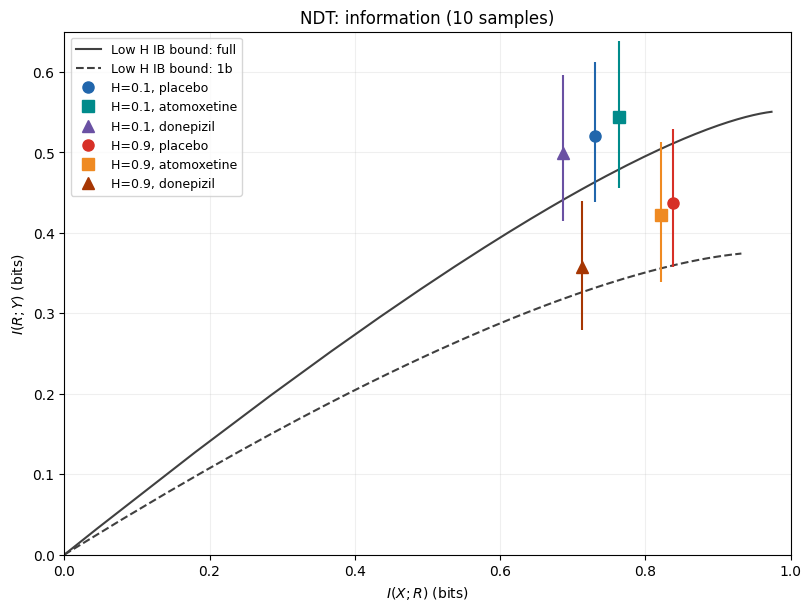

In [61]:
participant = 'NDT'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

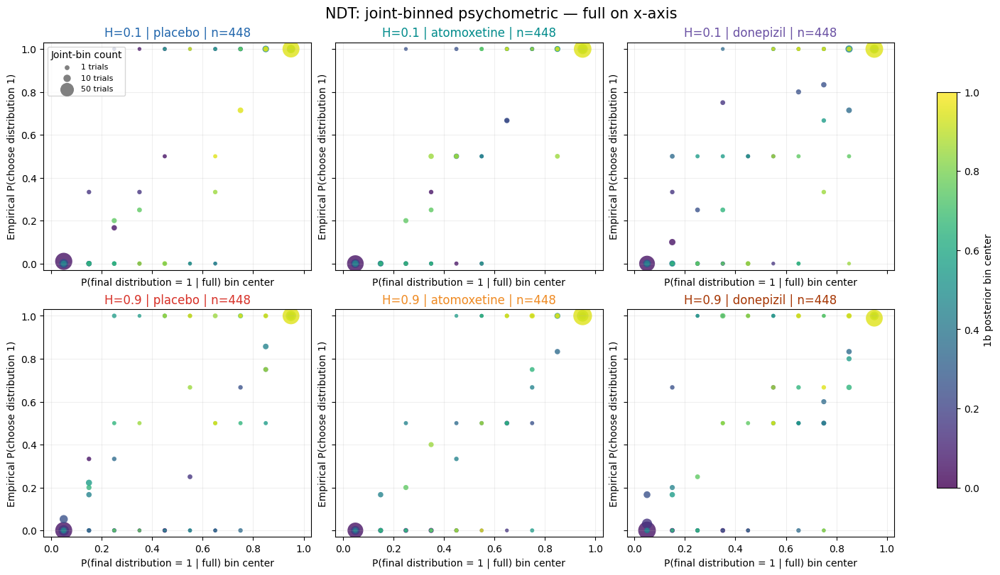

In [62]:
fig = plot_psychometrics('NDT', x_dimension=0)
plt.show()
plt.close(fig)

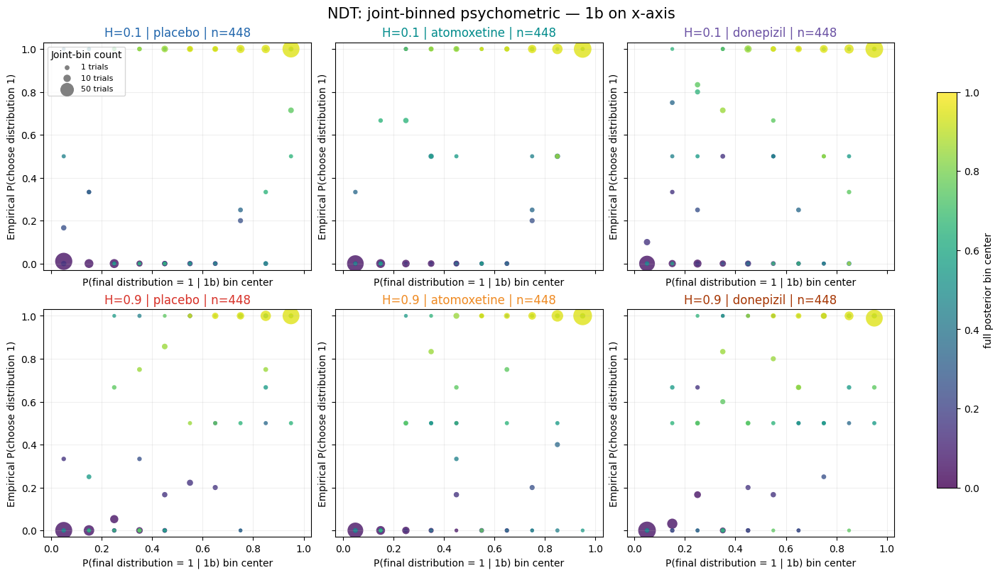

In [63]:
fig = plot_psychometrics('NDT', x_dimension=1)
plt.show()
plt.close(fig)

## Participant OIG

,H,drug,selected_trials,Ixr,Iry
109,0.1,atomoxetine,448,0.790136,0.521818
113,0.1,donepizil,447,0.784259,0.455449
111,0.1,placebo,448,0.757995,0.471183
108,0.9,atomoxetine,448,0.677782,0.379235
112,0.9,donepizil,447,0.742865,0.423795
110,0.9,placebo,421,0.691122,0.434320


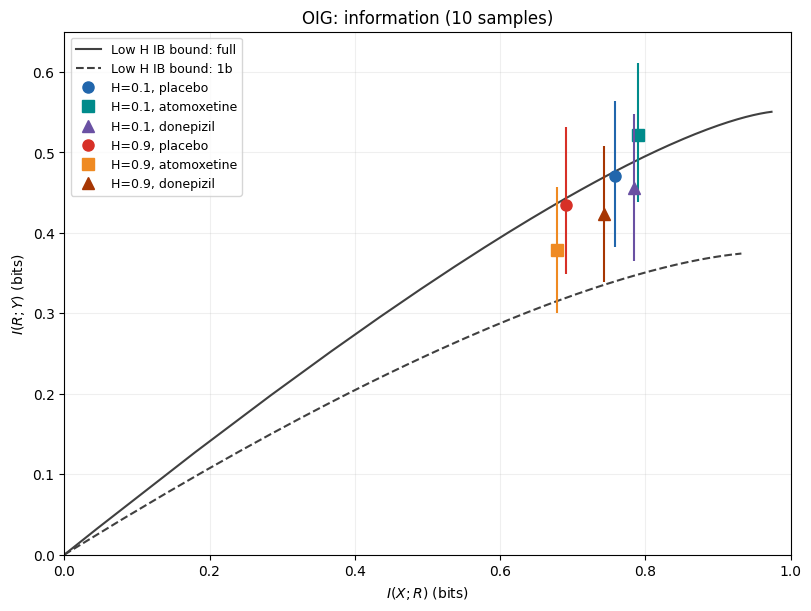

In [64]:
participant = 'OIG'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

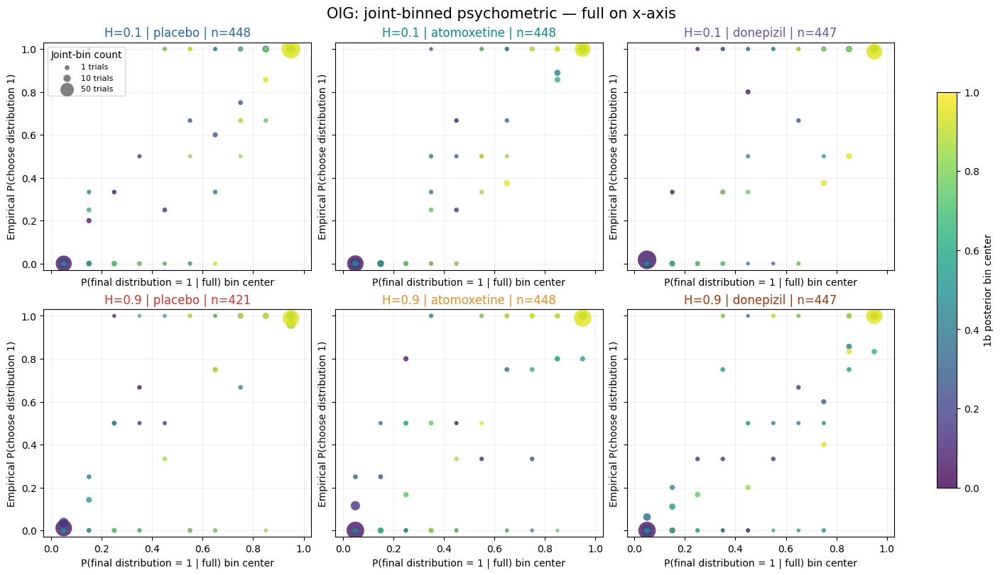

In [65]:
fig = plot_psychometrics('OIG', x_dimension=0)
plt.show()
plt.close(fig)

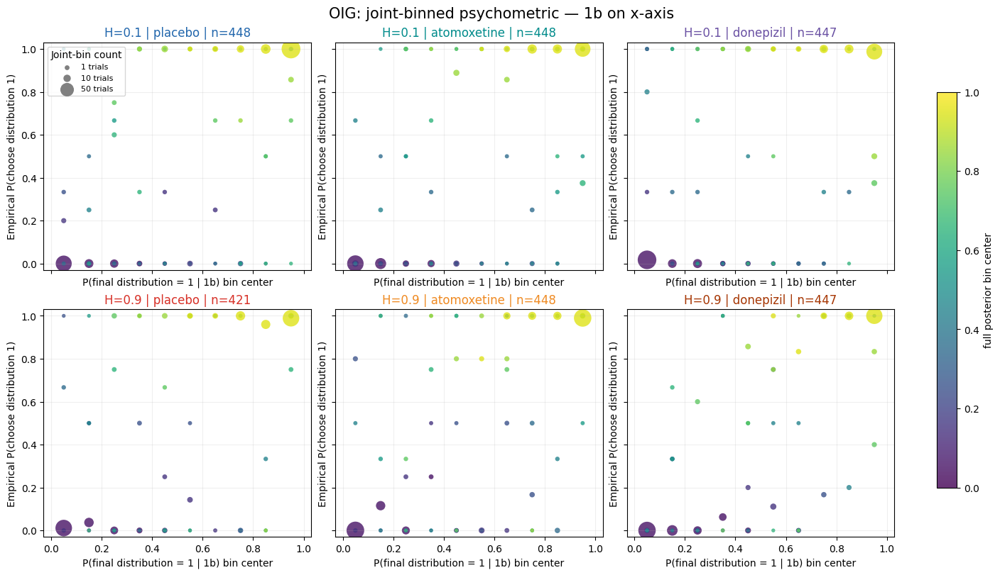

In [66]:
fig = plot_psychometrics('OIG', x_dimension=1)
plt.show()
plt.close(fig)

## Participant QLW

,H,drug,selected_trials,Ixr,Iry
115,0.1,atomoxetine,448,0.765444,0.510753
119,0.1,donepizil,448,0.817876,0.468744
117,0.1,placebo,448,0.709618,0.357860
114,0.9,atomoxetine,448,0.678333,0.351914
118,0.9,donepizil,448,0.775792,0.449136
116,0.9,placebo,448,0.488197,0.264341


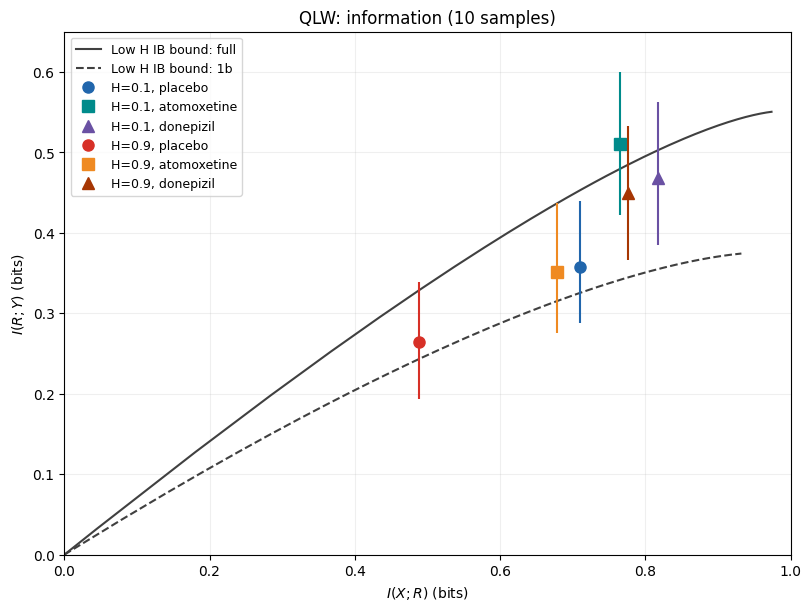

In [67]:
participant = 'QLW'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

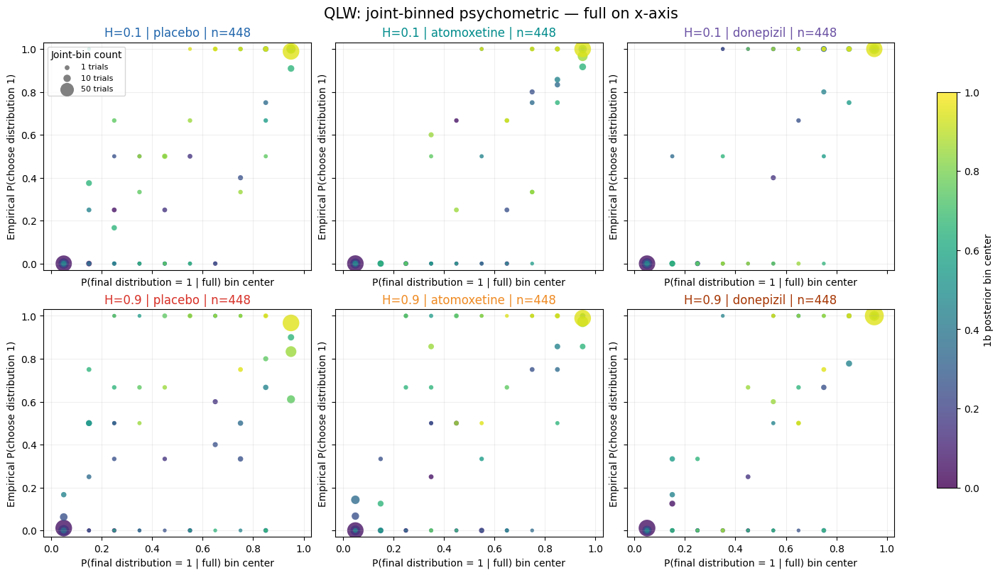

In [68]:
fig = plot_psychometrics('QLW', x_dimension=0)
plt.show()
plt.close(fig)

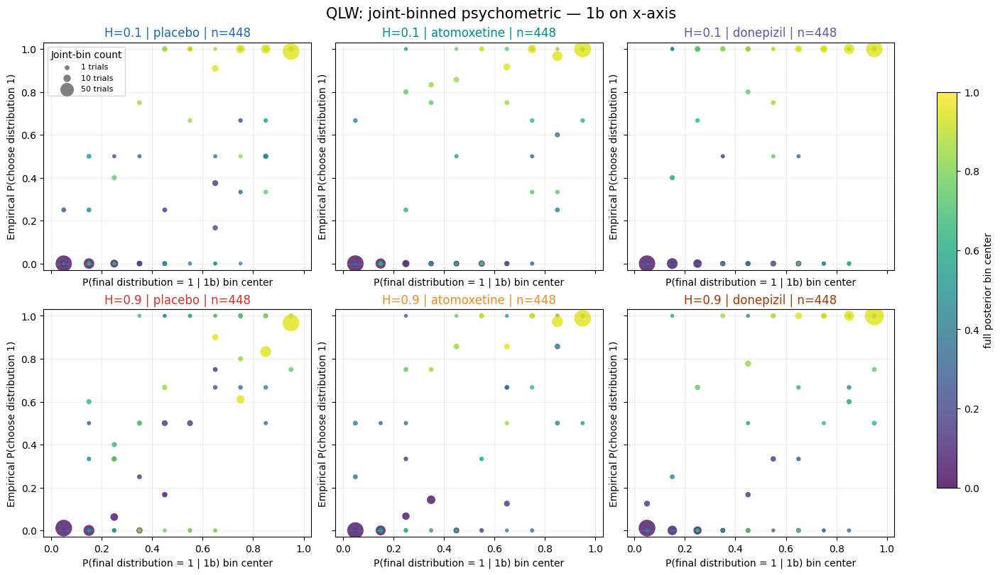

In [69]:
fig = plot_psychometrics('QLW', x_dimension=1)
plt.show()
plt.close(fig)

## Participant RGT

,H,drug,selected_trials,Ixr,Iry
121,0.1,atomoxetine,448,0.753521,0.490845
125,0.1,donepizil,448,0.764741,0.480957
123,0.1,placebo,448,0.685174,0.485927
120,0.9,atomoxetine,445,0.698373,0.407143
124,0.9,donepizil,448,0.467154,0.362468
122,0.9,placebo,420,0.279647,0.240335


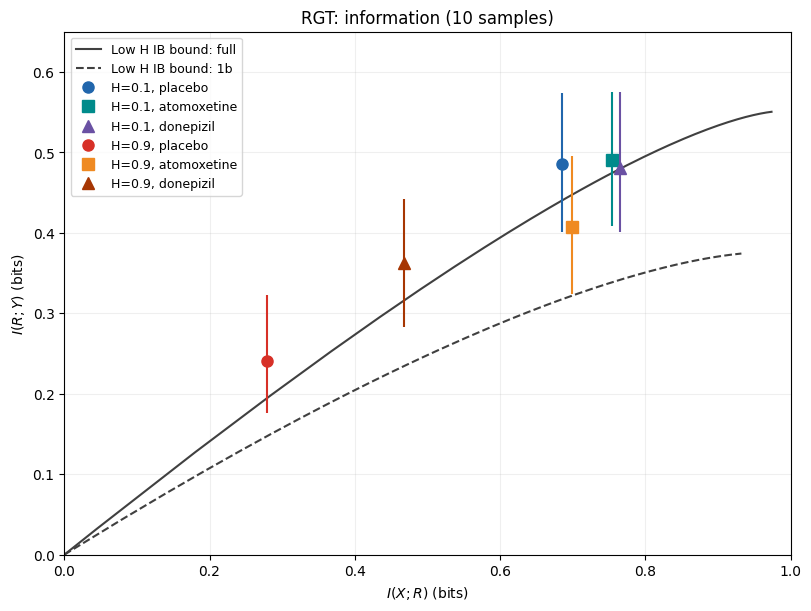

In [70]:
participant = 'RGT'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

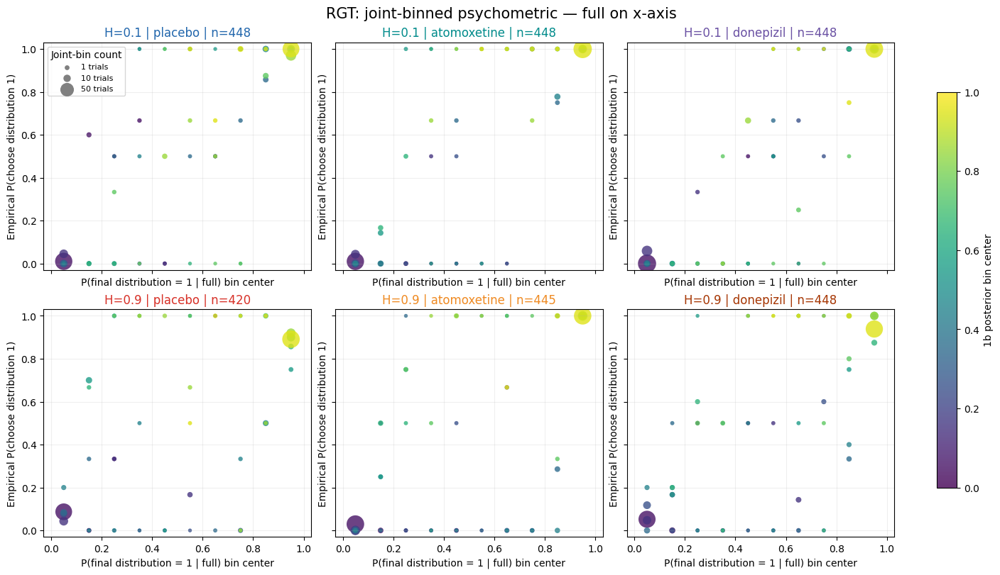

In [71]:
fig = plot_psychometrics('RGT', x_dimension=0)
plt.show()
plt.close(fig)

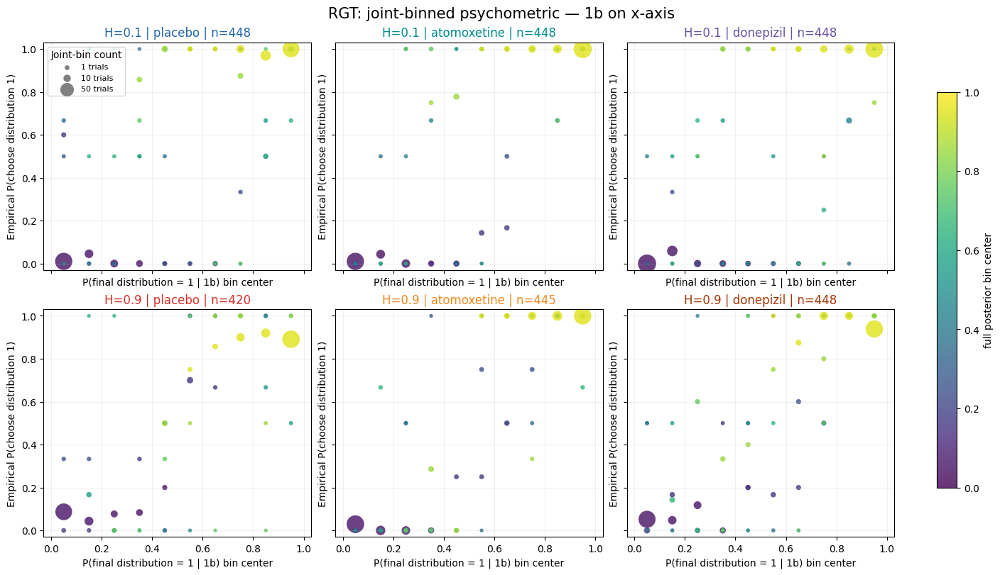

In [72]:
fig = plot_psychometrics('RGT', x_dimension=1)
plt.show()
plt.close(fig)

## Participant ROW

,H,drug,selected_trials,Ixr,Iry
127,0.1,atomoxetine,448,0.766639,0.492915
131,0.1,donepizil,448,0.819223,0.488096
129,0.1,placebo,448,0.772592,0.495390
126,0.9,atomoxetine,448,0.779695,0.482907
130,0.9,donepizil,448,0.819057,0.587949
128,0.9,placebo,448,0.779353,0.490604


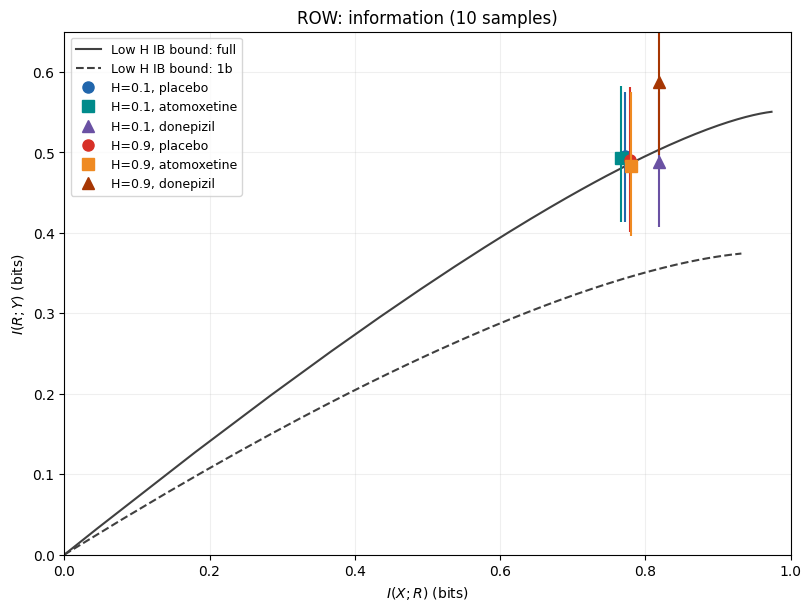

In [73]:
participant = 'ROW'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

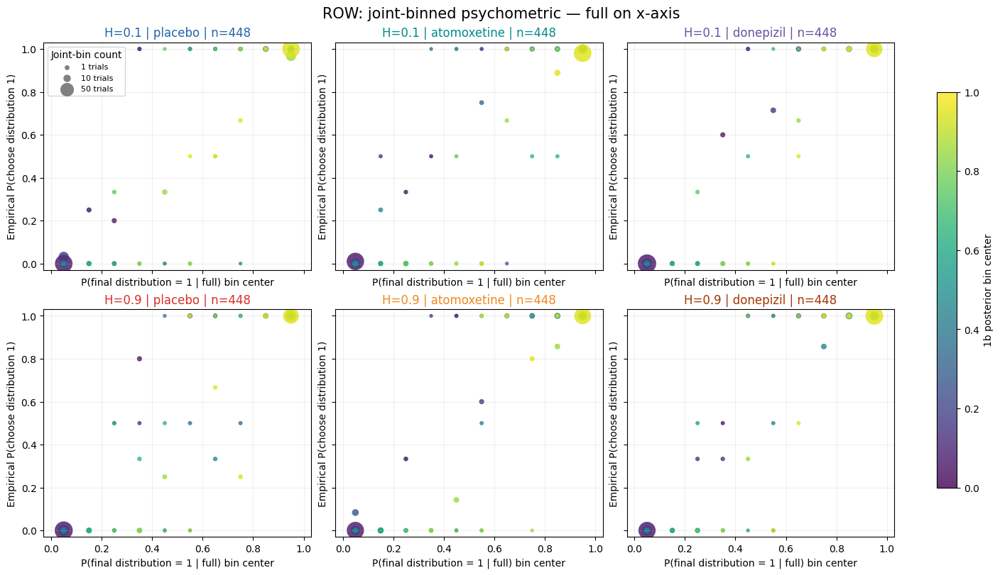

In [74]:
fig = plot_psychometrics('ROW', x_dimension=0)
plt.show()
plt.close(fig)

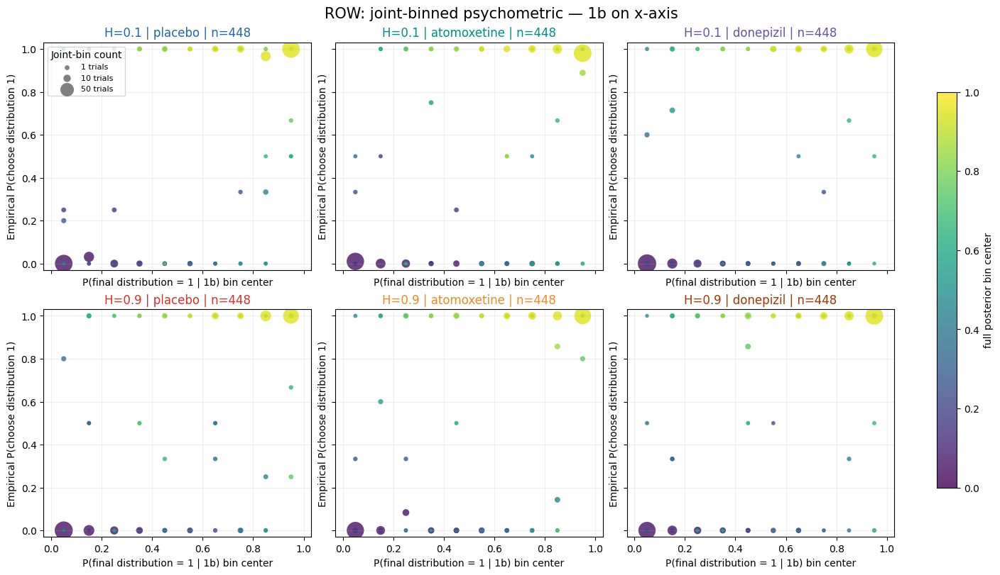

In [75]:
fig = plot_psychometrics('ROW', x_dimension=1)
plt.show()
plt.close(fig)

## Participant RPC

,H,drug,selected_trials,Ixr,Iry
133,0.1,atomoxetine,336,0.797087,0.421616
137,0.1,donepizil,448,0.570174,0.236630
135,0.1,placebo,392,0.801372,0.449325
132,0.9,atomoxetine,448,0.292402,0.170359
136,0.9,donepizil,448,0.661422,0.244297
134,0.9,placebo,422,0.541625,0.197382


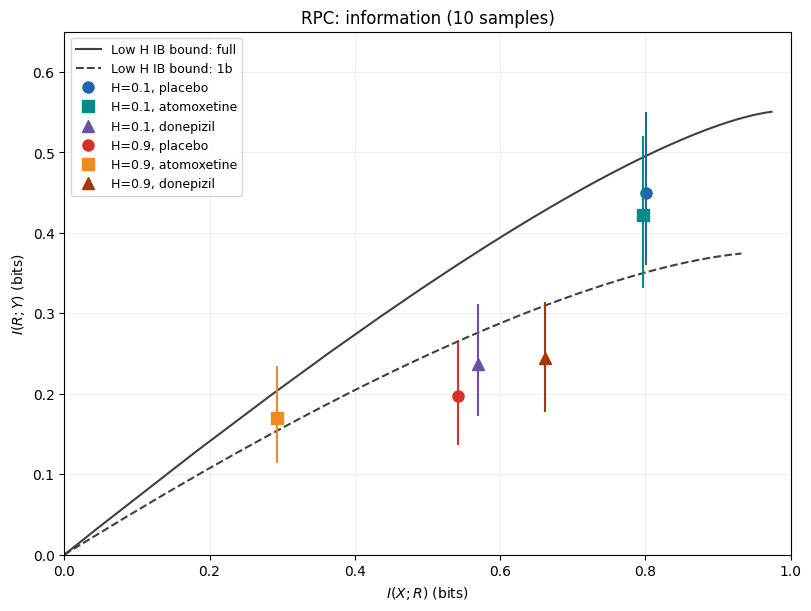

In [76]:
participant = 'RPC'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

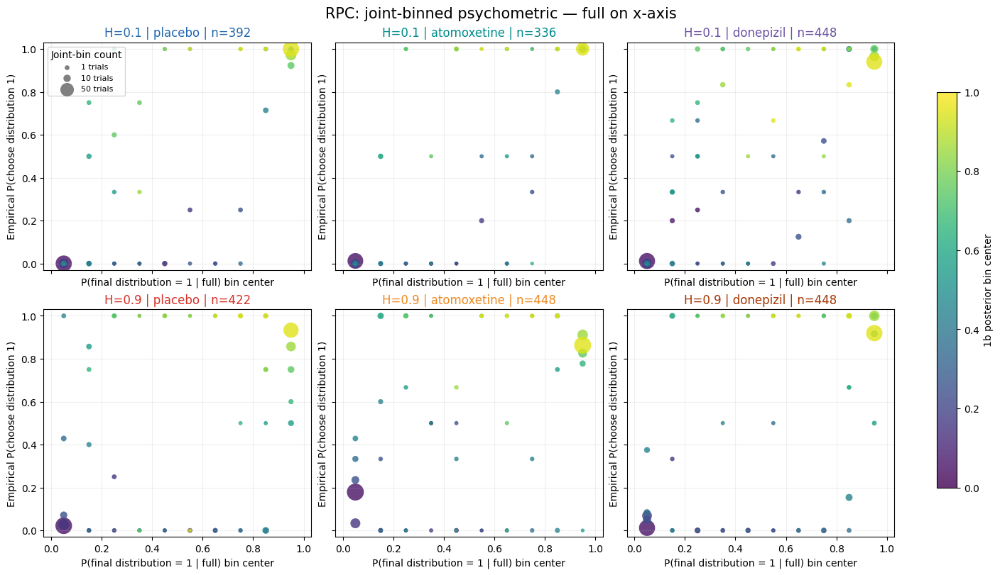

In [77]:
fig = plot_psychometrics('RPC', x_dimension=0)
plt.show()
plt.close(fig)

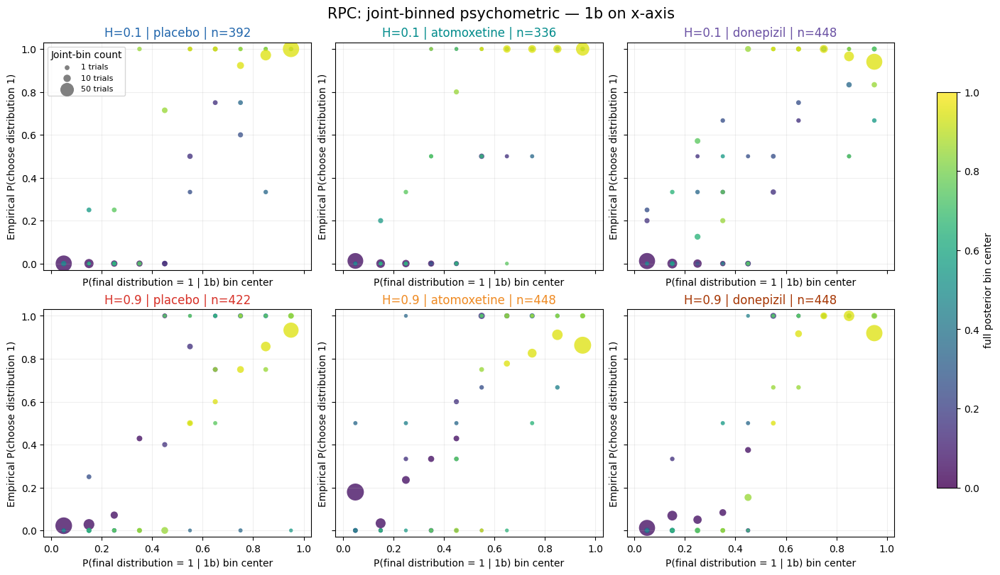

In [78]:
fig = plot_psychometrics('RPC', x_dimension=1)
plt.show()
plt.close(fig)

## Participant TMW

,H,drug,selected_trials,Ixr,Iry
139,0.1,atomoxetine,448,0.540281,0.342673
143,0.1,donepizil,448,0.540733,0.357648
141,0.1,placebo,448,0.673952,0.475214
138,0.9,atomoxetine,435,0.424381,0.266741
142,0.9,donepizil,448,0.709564,0.393983
140,0.9,placebo,448,0.633190,0.336130


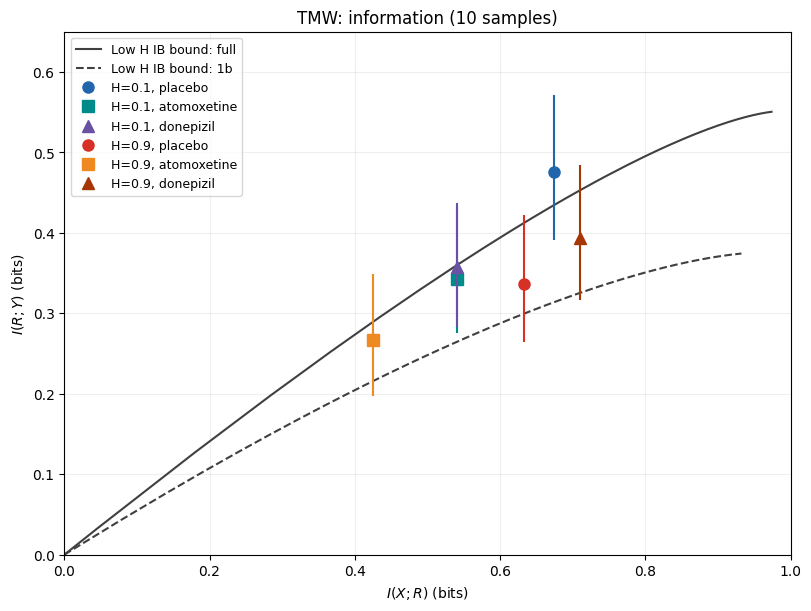

In [79]:
participant = 'TMW'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

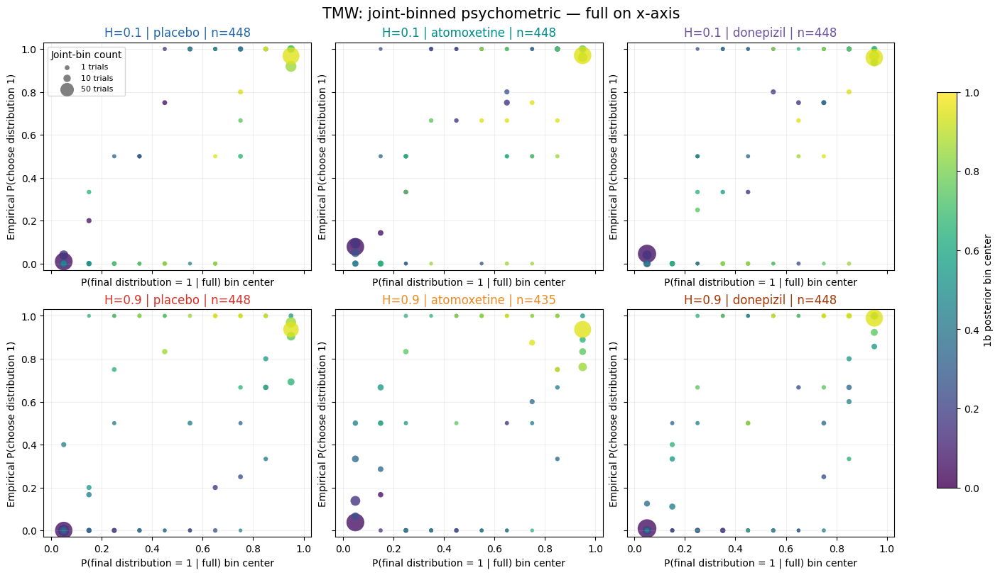

In [80]:
fig = plot_psychometrics('TMW', x_dimension=0)
plt.show()
plt.close(fig)

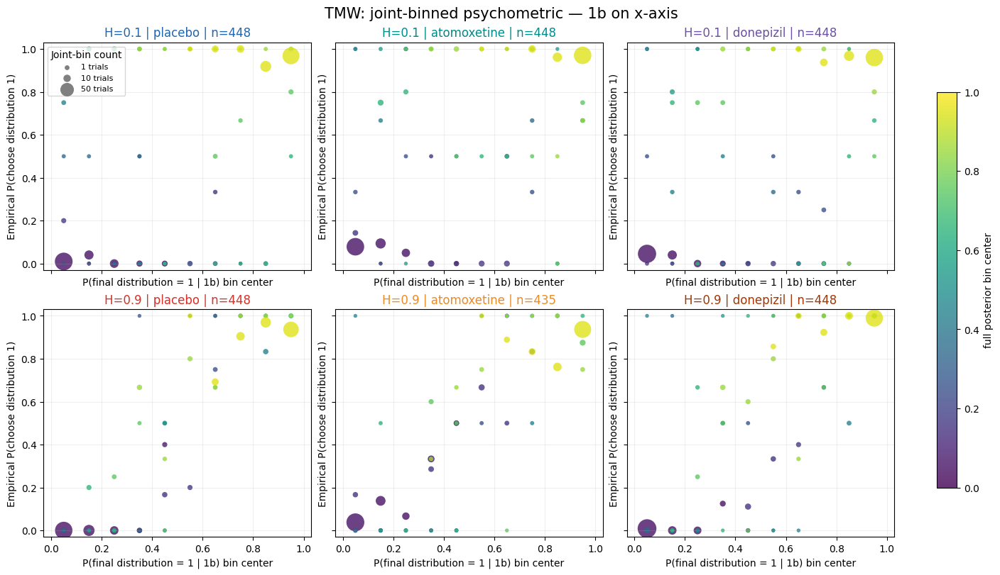

In [81]:
fig = plot_psychometrics('TMW', x_dimension=1)
plt.show()
plt.close(fig)

## Participant UDK

,H,drug,selected_trials,Ixr,Iry
145,0.1,atomoxetine,448,0.708096,0.444944
149,0.1,donepizil,448,0.743086,0.456118
147,0.1,placebo,406,0.651044,0.433480
144,0.9,atomoxetine,448,0.687852,0.368159
148,0.9,donepizil,448,0.613074,0.323582
146,0.9,placebo,451,0.466543,0.272745


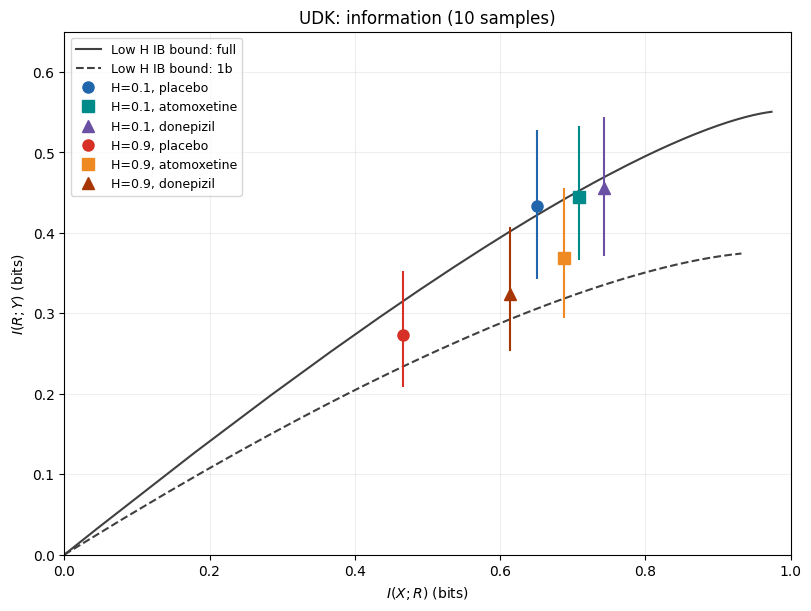

In [82]:
participant = 'UDK'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

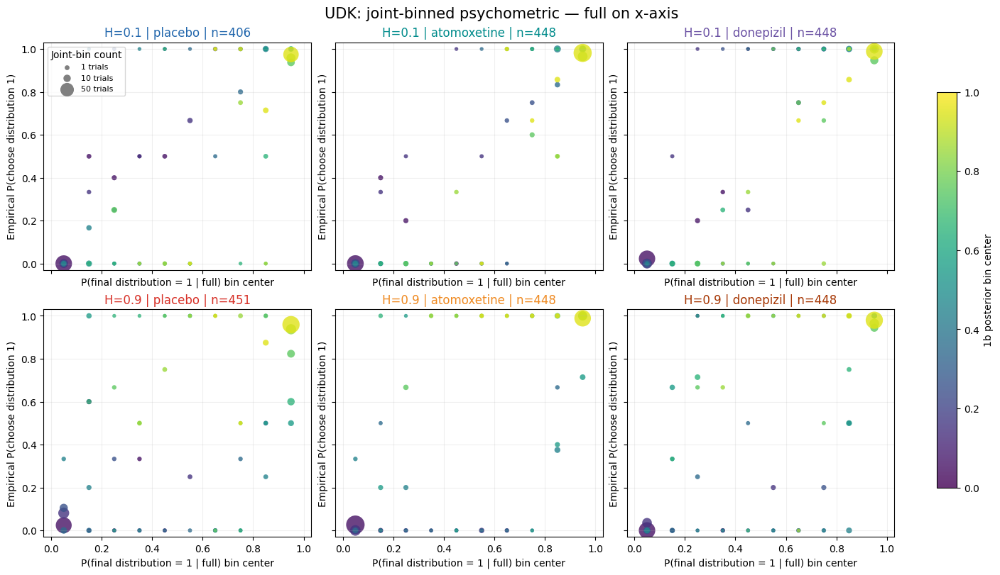

In [83]:
fig = plot_psychometrics('UDK', x_dimension=0)
plt.show()
plt.close(fig)

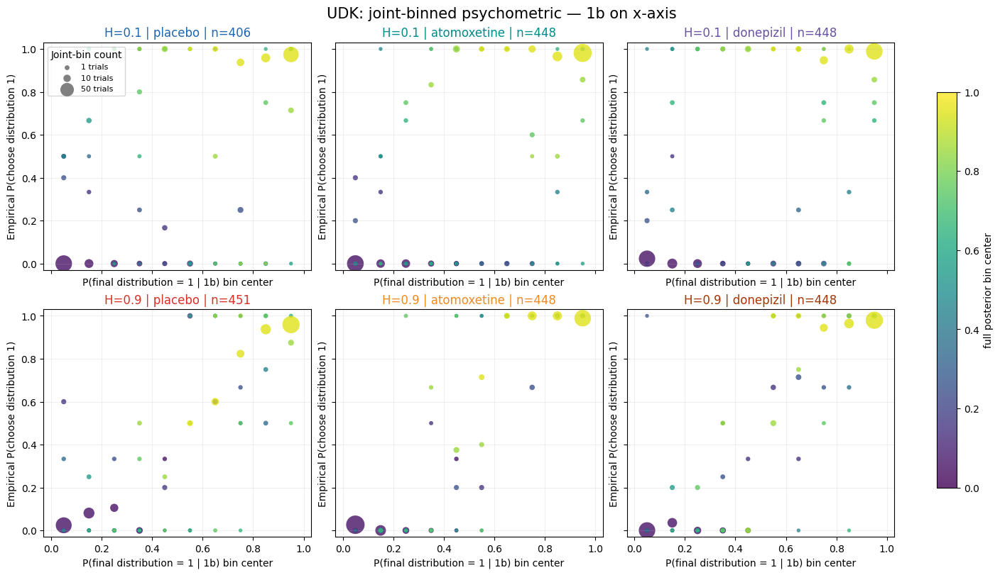

In [84]:
fig = plot_psychometrics('UDK', x_dimension=1)
plt.show()
plt.close(fig)

## Participant UOC

,H,drug,selected_trials,Ixr,Iry
151,0.1,atomoxetine,381,0.492137,0.328464
155,0.1,donepizil,392,0.514328,0.382296
153,0.1,placebo,448,0.485438,0.342037
150,0.9,atomoxetine,392,0.337573,0.142956
154,0.9,donepizil,448,0.278468,0.090207
152,0.9,placebo,448,0.344947,0.076654


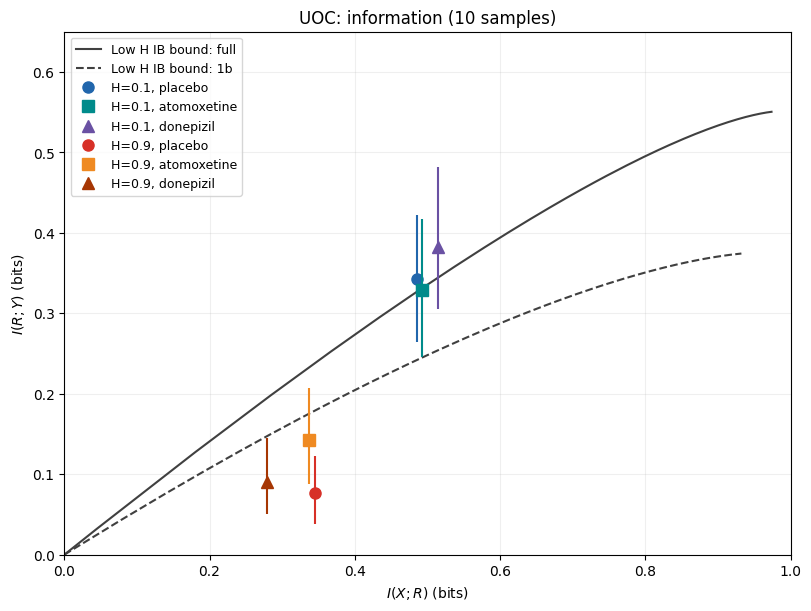

In [85]:
participant = 'UOC'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

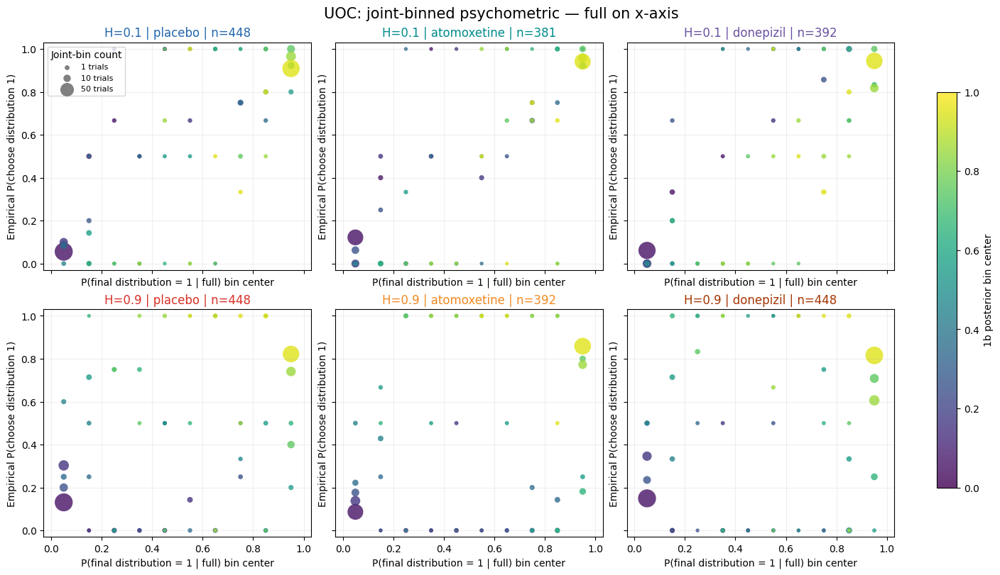

In [86]:
fig = plot_psychometrics('UOC', x_dimension=0)
plt.show()
plt.close(fig)

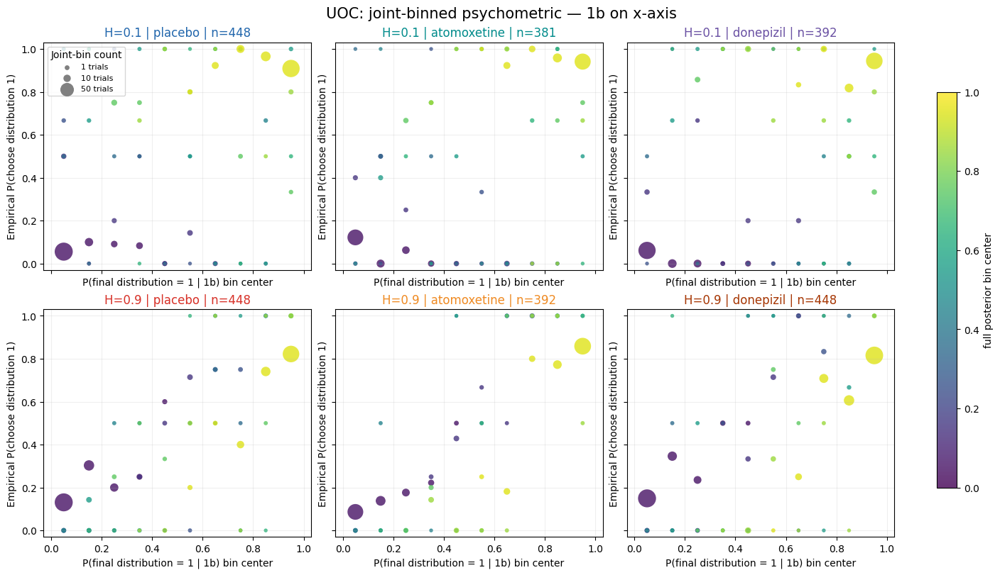

In [87]:
fig = plot_psychometrics('UOC', x_dimension=1)
plt.show()
plt.close(fig)

## Participant URG

,H,drug,selected_trials,Ixr,Iry
157,0.1,atomoxetine,389,0.561835,0.377803
161,0.1,donepizil,392,0.705450,0.463193
159,0.1,placebo,392,0.651269,0.455412
156,0.9,atomoxetine,392,0.599738,0.394155
160,0.9,donepizil,392,0.779484,0.424620
158,0.9,placebo,390,0.373841,0.331314


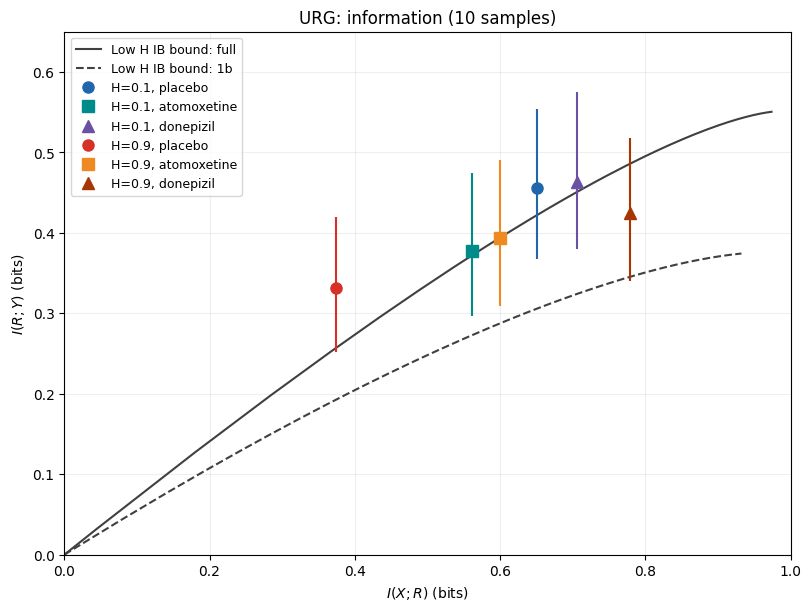

In [88]:
participant = 'URG'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

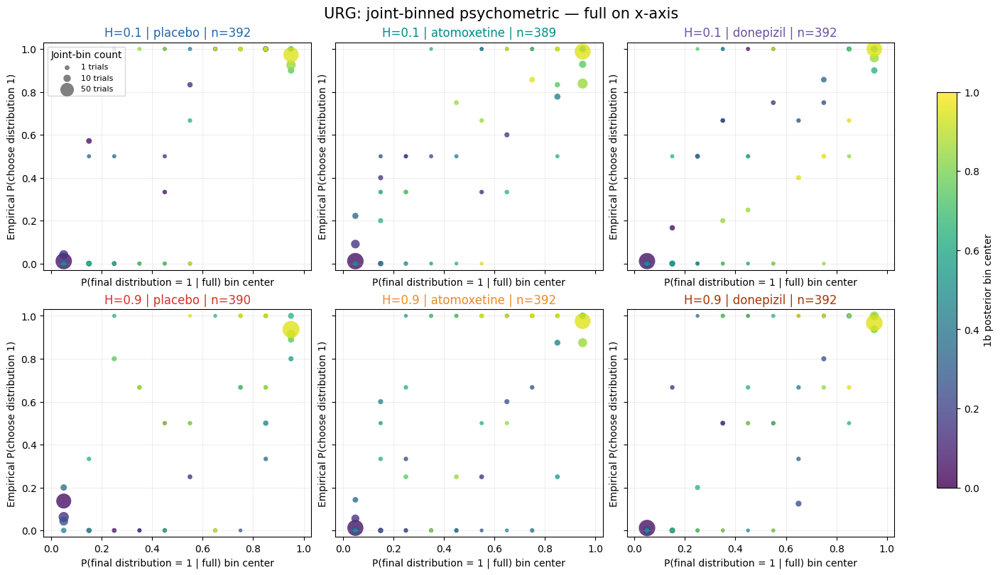

In [89]:
fig = plot_psychometrics('URG', x_dimension=0)
plt.show()
plt.close(fig)

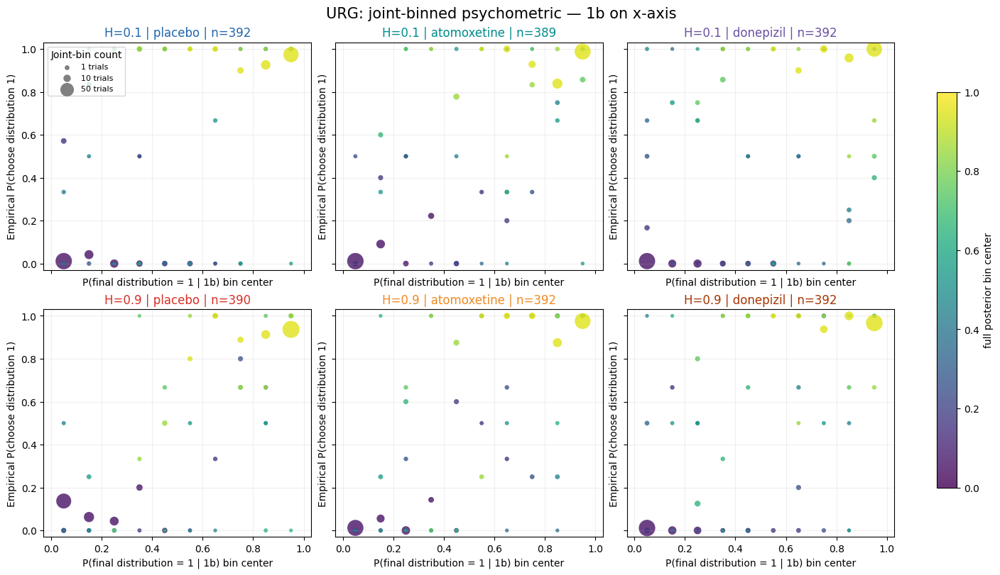

In [90]:
fig = plot_psychometrics('URG', x_dimension=1)
plt.show()
plt.close(fig)

## Participant UXQ

,H,drug,selected_trials,Ixr,Iry
163,0.1,atomoxetine,448,0.726521,0.425741
167,0.1,donepizil,448,0.744597,0.387814
165,0.1,placebo,448,0.727549,0.446589
162,0.9,atomoxetine,392,0.720198,0.434155
166,0.9,donepizil,448,0.869240,0.383779
164,0.9,placebo,448,0.770671,0.402999


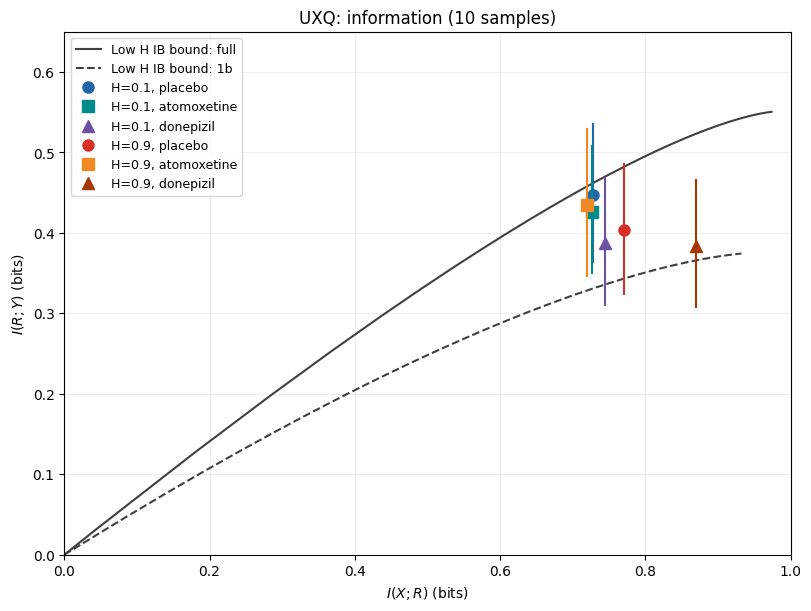

In [91]:
participant = 'UXQ'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

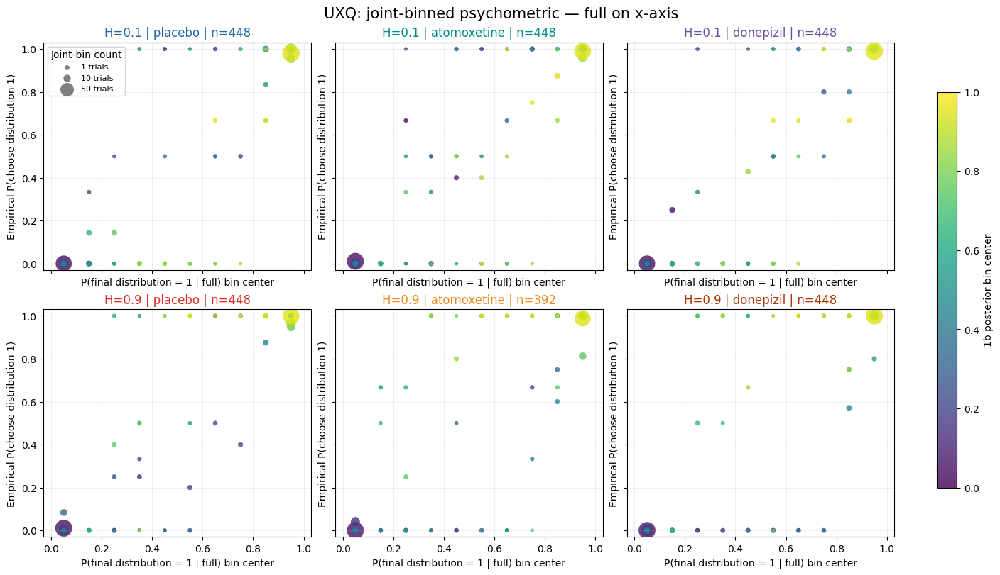

In [92]:
fig = plot_psychometrics('UXQ', x_dimension=0)
plt.show()
plt.close(fig)

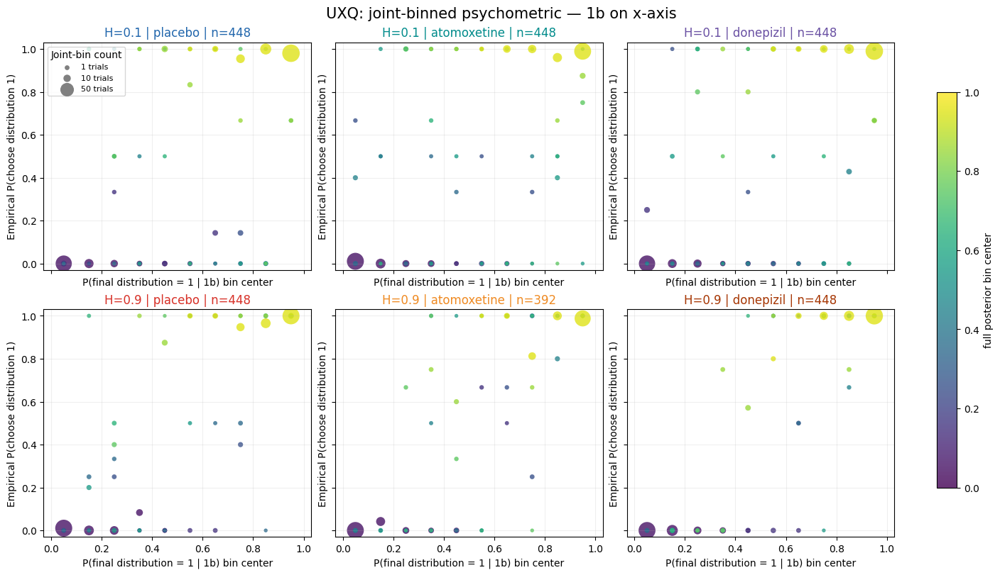

In [93]:
fig = plot_psychometrics('UXQ', x_dimension=1)
plt.show()
plt.close(fig)

## Participant VTQ

,H,drug,selected_trials,Ixr,Iry
169,0.1,atomoxetine,448,0.711067,0.460661
173,0.1,donepizil,448,0.745158,0.559933
171,0.1,placebo,448,0.746128,0.488096
168,0.9,atomoxetine,448,0.785357,0.507040
172,0.9,donepizil,448,0.688687,0.491015
170,0.9,placebo,447,0.750207,0.466782


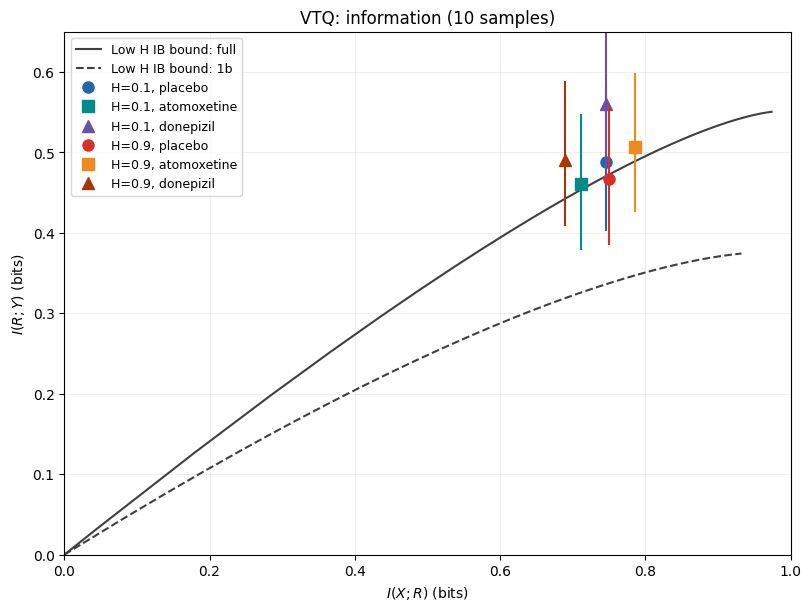

In [94]:
participant = 'VTQ'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

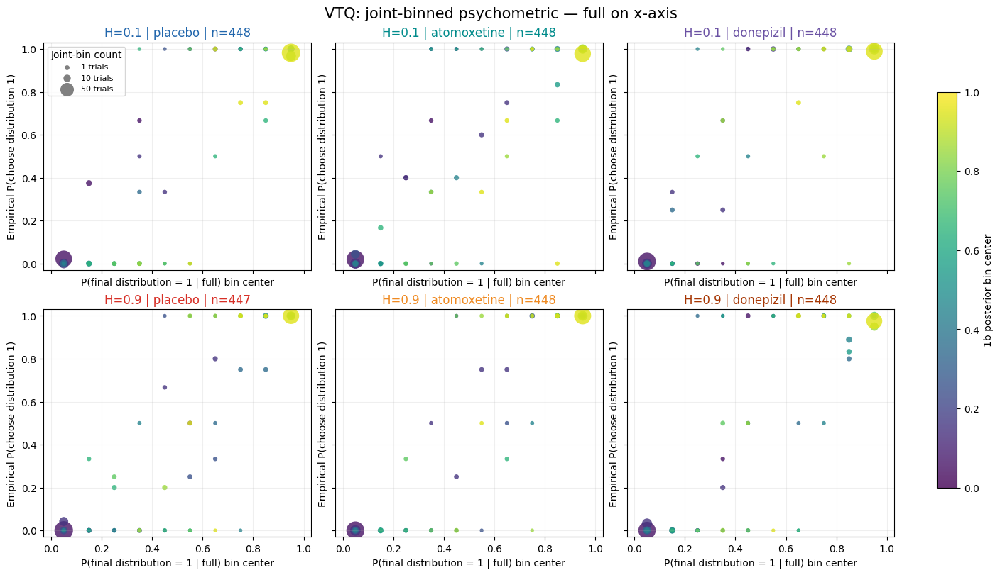

In [95]:
fig = plot_psychometrics('VTQ', x_dimension=0)
plt.show()
plt.close(fig)

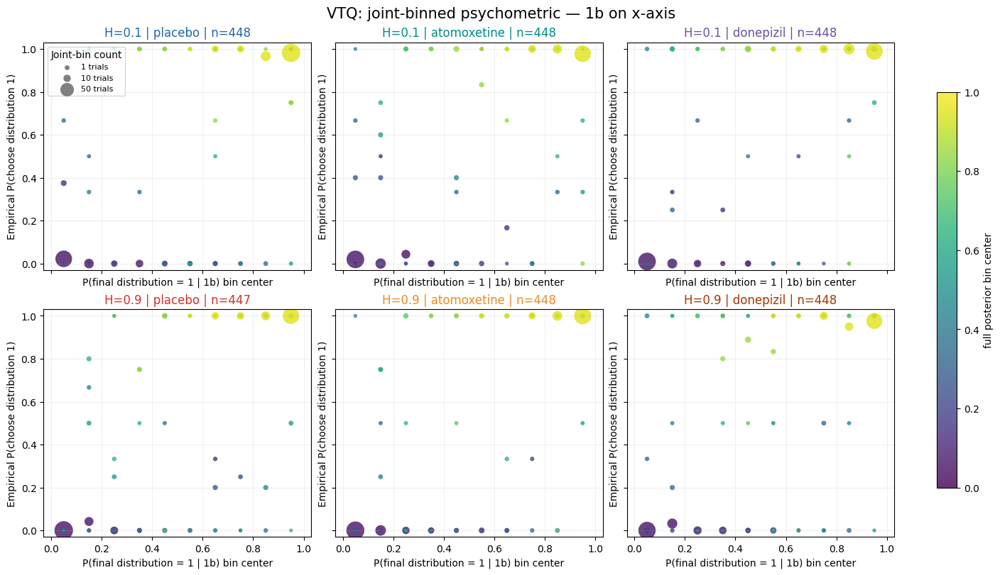

In [96]:
fig = plot_psychometrics('VTQ', x_dimension=1)
plt.show()
plt.close(fig)

## Participant XUE

,H,drug,selected_trials,Ixr,Iry
175,0.1,atomoxetine,448,0.769634,0.475547
179,0.1,donepizil,448,0.827427,0.431674
177,0.1,placebo,448,0.786294,0.425226
174,0.9,atomoxetine,448,0.765586,0.327432
178,0.9,donepizil,448,0.855971,0.281407
176,0.9,placebo,448,0.928532,0.365547


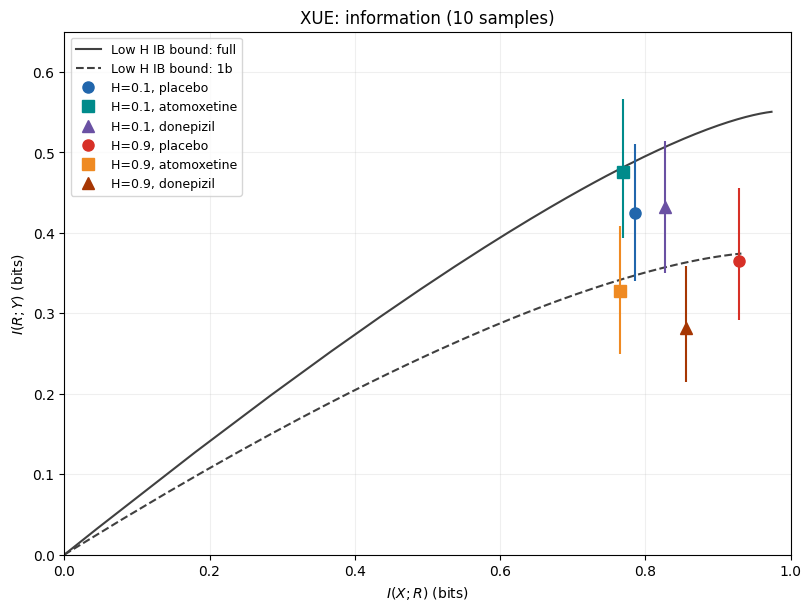

In [97]:
participant = 'XUE'
display(count_check.loc[count_check.participant.eq(participant),
                        ['H', 'drug', 'selected_trials', 'Ixr', 'Iry']].sort_values(['H', 'drug']))
fig = plot_information(participant)
plt.show()
plt.close(fig)

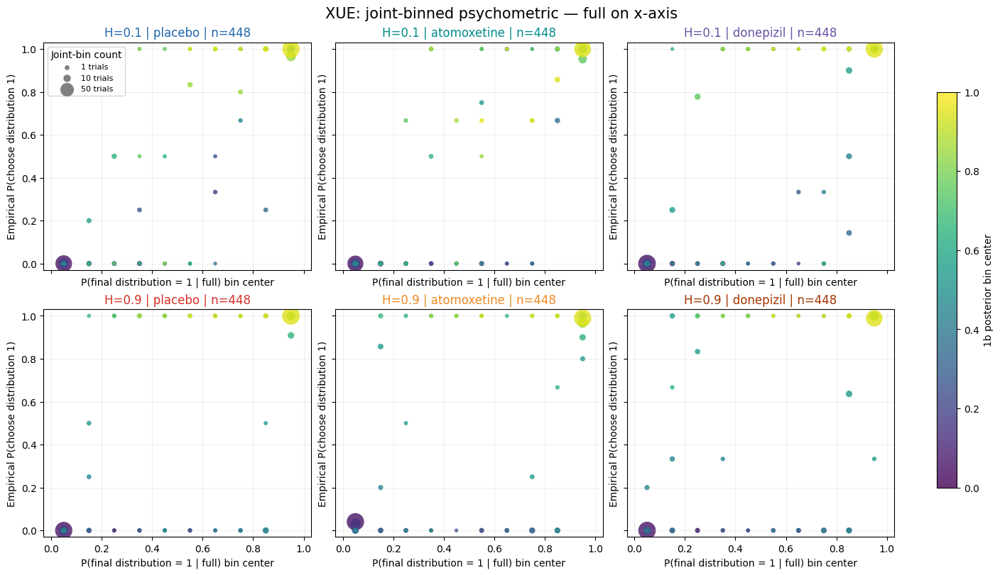

In [98]:
fig = plot_psychometrics('XUE', x_dimension=0)
plt.show()
plt.close(fig)

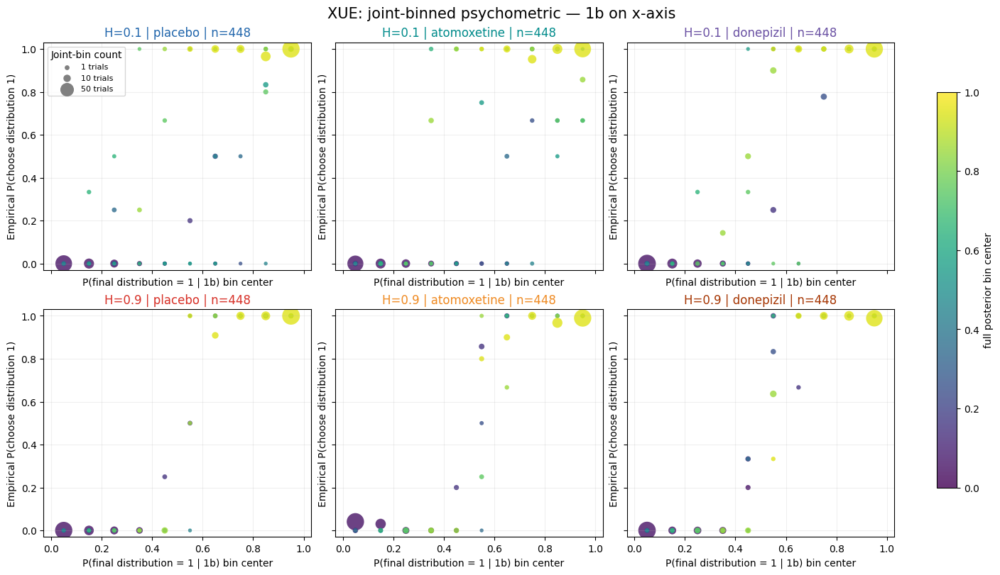

In [99]:
fig = plot_psychometrics('XUE', x_dimension=1)
plt.show()
plt.close(fig)